In [2]:
using ModelingToolkit, OrdinaryDiffEq, DifferentialEquations, LinearAlgebra, SparseArrays

In [3]:
using PyPlot, NNlib,  ImageFiltering, Images, MEngProject, MEngProject.LamKernels, MEngProject.Laminart, MEngProject.Utils, BenchmarkTools

┌ Warning: Hardware is unsupported by NNPACK so falling back to default NNlib
└ @ NNlib /Users/niallcullinane/.julia/packages/NNlib/GhWiz/src/nnpack/NNPACK.jl:42


In [ ]:
using ModelingToolkit, OrdinaryDiffEq, DifferentialEquations, LinearAlgebra, SparseArrays, PyPlot, NNlib,  ImageFiltering, Images, MEngProject, MEngProject.LamKernels, MEngProject.Laminart, MEngProject.Utils, BenchmarkTools

In [124]:
ff! = @ode_def ff begin
        dv_p = Laminart.fun_dv(v_p, p.r, x_lgn, p)
        dv_m = Laminart.fun_dv(v_m, .-p.r, x_lgn, p)
        dx = Laminart.fun_dx_V1(x, C, z, p.x_V2, p)
        dy = Laminart.fun_dy(y, C, x, m, p)
        dm = Laminart.fun_dm(m, x, p)
        dz = Laminart.fun_dz(z, y, H_z, s, p)
        ds = Laminart.fun_ds(s, z, H_z, p)
    end p

LoadError: MethodError: no method matching getproperty(::Module, ::Expr)
Closest candidates are:
  getproperty(::Module, !Matched::Symbol) at Base.jl:26
  getproperty(::Any, !Matched::Symbol) at Base.jl:33

In [103]:
img = convert(CuArray{Float32,2}, load("./input_img/Iine_100_100_gs.png"))
p = LaminartGPU.kernels(img, Parameters.parameters)
p = LaminartGPU.add_I_u_p(img, p)
u0 = reshape(CUDA.zeros(p.dim_i, p.dim_j*(5*p.K+2)), p.dim_i, p.dim_j, 5*p.K+2)
prob = ODEProblem(LaminartGPU.f!,u0,(0.0f0,10.0f0),p)
@btime sol = solve(prob)

In [103]:
img = convert(Array{Float32,2}, load("./input_img/Iine_100_100_gs.png"))
p = Laminart.kernels(img, Parameters.parameters)
p = Laminart.add_I_u_p(img, p)
u0 = reshape(zeros(p.dim_i, p.dim_j*(5*p.K+2)), p.dim_i, p.dim_j, 5*p.K+2)
prob = ODEProblem(Laminart.f!,u0,(0.0f0,10.0f0),p)
@btime sol = solve(prob)

In [103]:
img = convert(Array{Float32,2}, load("./input_img/Iine_100_100_gs.png"))
p = Laminart.kernels(img, Parameters.parameters)
p = Laminart.add_I_u_p(img, p)
u0 = reshape(zeros(p.dim_i, p.dim_j*(5*p.K+2)), p.dim_i, p.dim_j, 5*p.K+2)
prob = ODEProblem(Laminart.f!,u0,(0.0f0,10.0f0),p)
sol = solve(prob, progress=true)

In [ ]:
# p = Laminart.kernels(img, Parameters.parameters);
# p = Laminart.add_I_u_p(img, p);
# # @parameters t 
# # @variables du[1:p.dim_i, 1:p.dim_j, 1:5*p.K+2](t) u[1:p.dim_i, 1:p.dim_j, 1:5*p.K+2](t) x_lgn[1:p.dim_i, 1:p.dim_j](t) C[1:p.dim_i, 1:p.dim_j, 1:p.K](t) H_z[1:p.dim_i, 1:p.dim_j, 1:p.K](t); 
# Laminart.f!(du,u,p,0.0);
# u0 = reshape(zeros(p.dim_i, p.dim_j*(5*p.K+2)), p.dim_i, p.dim_j, 5*p.K+2);
# # jac = sparse(ModelingToolkit.jacobian(vec(du),vec(u),simplify=false))

# # fjac = eval(ModelingToolkit.build_function(jac,u));
# # prob_jac = ODEProblem(ODEFunction(ff!,jac = (du,u,p,t) -> fjac(du,u), jac_prototype = similar(jac,Float64)),u0,(0.0,10.0))
# # sol = solve(prob_jac)


In [6]:
img = convert(Array{Float32,2}, load("../input_img/Iine_100_100_gs.png"));

In [7]:
p = Laminart.kernels(img, Parameters.parameters);
p = Laminart.add_I_u_p(img, p);

In [71]:
u0 = reshape(zeros(p.dim_i, p.dim_j*(5*p.K+2)), p.dim_i, p.dim_j, 5*p.K+2);

In [52]:
function ff!(du, u, p, t)
   x = @view u[:, :, 1:p.K]
   y = @view u[:, :, p.K+1:2*p.K]
   m = @view u[:, :, 2*p.K+1:3*p.K]
   z = @view u[:, :, 3*p.K+1:4*p.K]
   s = @view u[:, :, 4*p.K+1:5*p.K]

#    C = @view uu[:, :, 5*p.K+1:6*p.K]
#    H_z = @view uu[:, :, 6*p.K+1:7*p.K]

   v_p = @view u[:, :, 5*p.K+1]
   v_m = @view u[:, :, 5*p.K+2]
#    x_lgn = @view uu[:, :, 7*p.K+3]

   dx = @view du[:, :, 1:p.K]
   dy = @view du[:, :, p.K+1:2*p.K]
   dm = @view du[:, :, 2*p.K+1:3*p.K]
   dz = @view du[:, :, 3*p.K+1:4*p.K]
   ds = @view du[:, :, 4*p.K+1:5*p.K]

   dv_p = @view du[:, :, 5*p.K+1]
   dv_m = @view du[:, :, 5*p.K+2]

#     x_lgn = zeros(p.dim_i, p.dim_j)
# C = reshape(zeros(p.dim_i, p.dim_j*p.K), p.dim_i, p.dim_j, p.K)
# H_z = copy(C);
    
   x_lgn = Laminart.fun_x_lgn(x, p)
   C = Laminart.fun_v_C(v_p, v_m, p)
   H_z = Laminart.fun_H_z(z, p)

#    dv_p = Laminart.fun_dv(v_p, p.r, x_lgn, p)
 v_p = ones(p.dim_i, p.dim_j)
#    dv_m = Laminart.fun_dv(v_m, .-p.r, x_lgn, p)
#    dx = Laminart.fun_dx_V1(x, C, z, p.x_V2, p)
#    dy = Laminart.fun_dy(y, C, x, m, p)
#    dm = Laminart.fun_dm(m, x, p)
#    dz = Laminart.fun_dz(z, y, H_z, s, p)
#    ds = Laminart.fun_ds(s, z, H_z, p)
end

ff! (generic function with 1 method)

In [73]:
# prob = ODEProblem(ff!,u0,(0.0,100.0),p);

In [83]:
prob = ODEProblem(Laminart.f!,u0,(0.0,100.0),p)

ODEProblem with uType Array{Float64,3} and tType Float64. In-place: true
timespan: (0.0, 100.0)
u0: [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

...

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

In [104]:
@btime sol = solve(prob)

  16.142 s (1360191 allocations: 10.25 GiB)


retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 97-element Array{Float64,1}:
   0.0
   9.999999999999999e-5
   0.0010999999999999998
   0.011099999999999997
   0.08170294078108636
   0.2192740305374748
   0.41303522553679756
   0.6704773679691466
   1.0051220939365144
   1.383440151248962
   1.9481896638077707
   2.5626427016607183
   3.3714377121759664
   ⋮
  87.4055992288806
  88.61103824877907
  89.8155651002055
  91.01969149841403
  92.22403128725577
  93.4289494881195
  94.63448096577564
  95.84039622483745
  97.04635728000679
  98.25206340363547
  99.45739054694907
 100.0
u: 97-element Array{Array{Float64,3},1}:
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

...

[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

[0.0 0.0 …

0.0

In [101]:
sol[1]

100×100×12 Array{Float64,3}:
[:, :, 1] =
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.

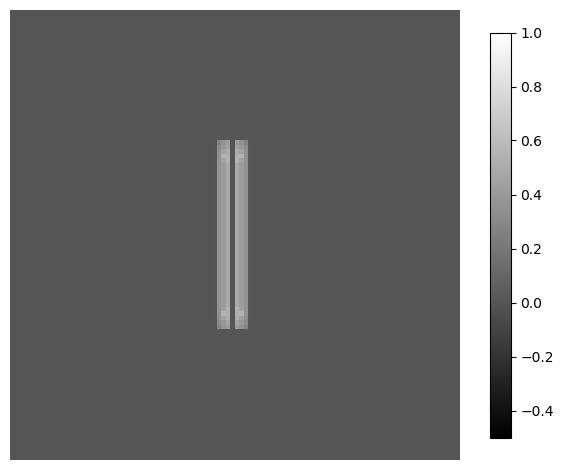

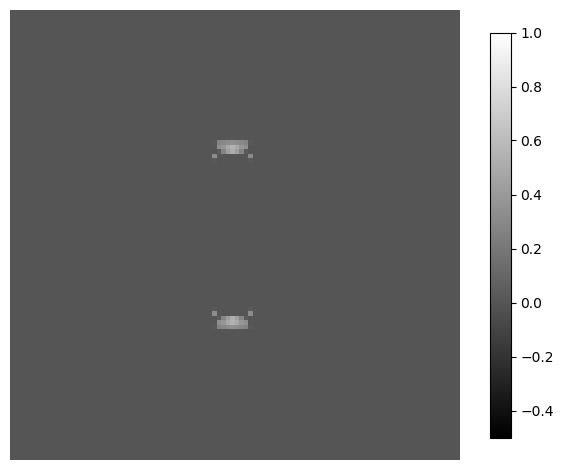

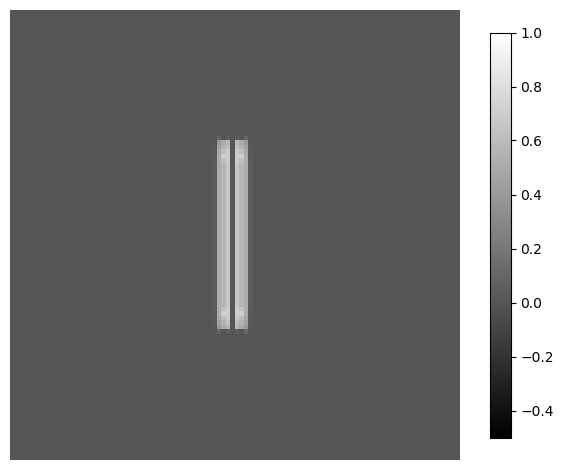

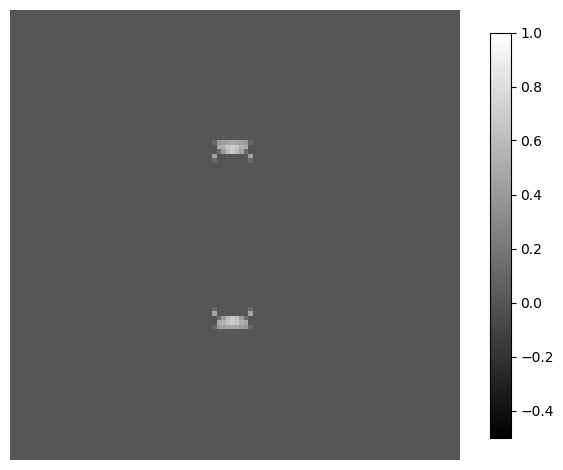

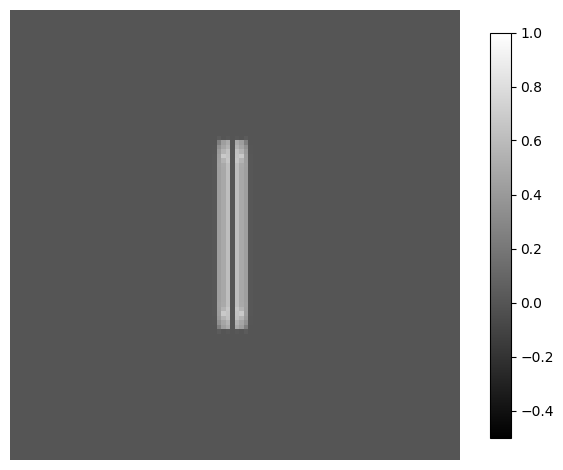

...

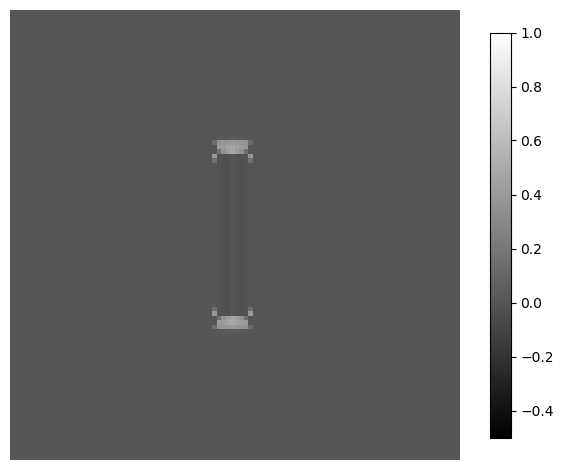

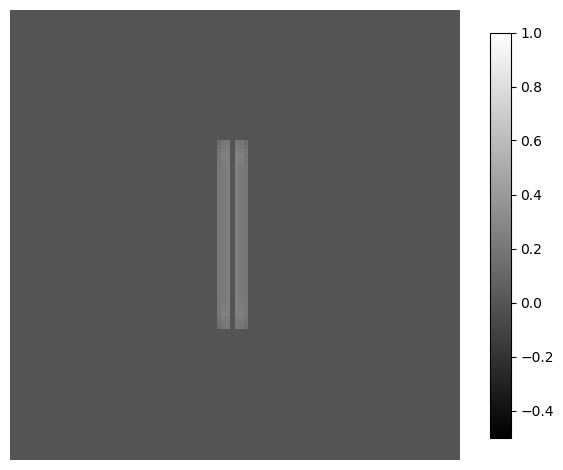

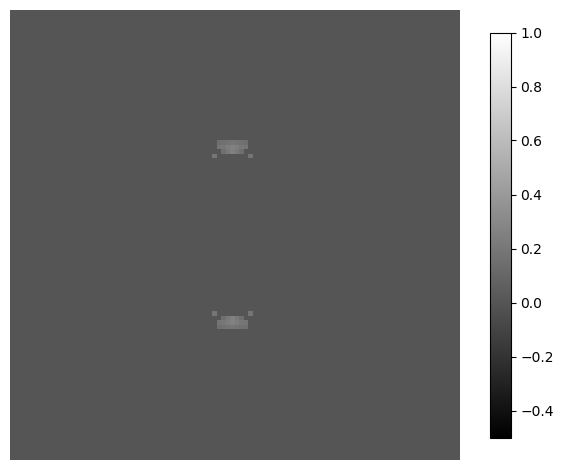

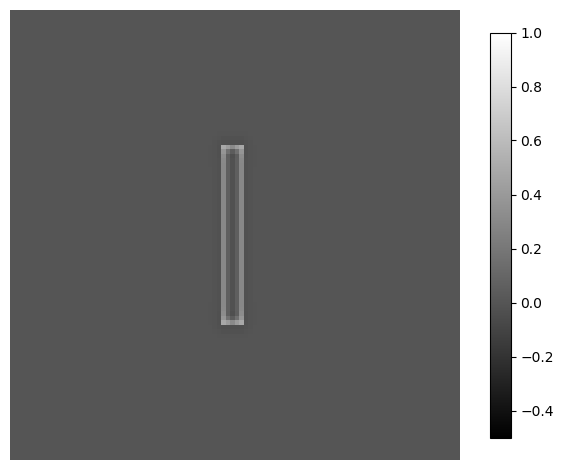

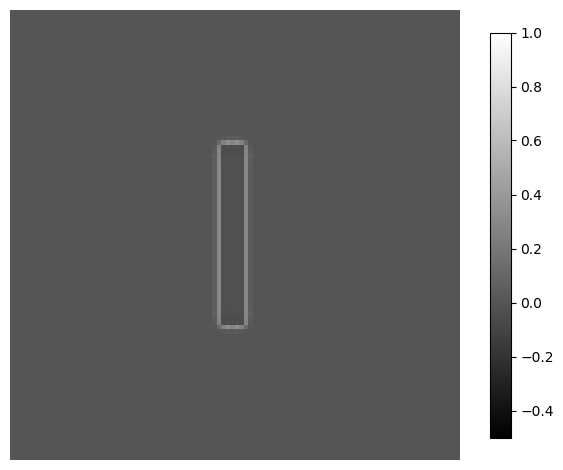

In [102]:
Utils.save_orientations_gs(sol(100), "u_first", -0.5,1, true)

┌ Error: (compiled mode) evaluation error starting at /Users/niallcullinane/.julia/dev/MEngProject/src/LaminartGPU.jl:17
│   mod = MEngProject.LaminartGPU
│   ex = begin
    #= /Users/niallcullinane/.julia/dev/MEngProject/src/./LaminartGPU.jl:17 =#
    using NNlib, ImageFiltering, Images, OffsetArrays, CUDA
end
│   exception = (ArgumentError("Package MEngProject does not have CUDA in its dependencies:\n- If you have MEngProject checked out for development and have\n  added CUDA as a dependency but haven't updated your primary\n  environment's manifest file, try `Pkg.resolve()`.\n- Otherwise you may need to report an issue with MEngProject"), Union{Ptr{Nothing}, Base.InterpreterIP}[Ptr{Nothing} @0x0000000149ed2465, Ptr{Nothing} @0x000000010d52e889, Ptr{Nothing} @0x000000010d52d73b, Ptr{Nothing} @0x000000010d513b87, Ptr{Nothing} @0x000000010d513e9c, Base.InterpreterIP in top-level CodeInfo for MEngProject.LaminartGPU at statement 0])
└ @ Revise /Users/niallcullinane/.julia/packages/Revis

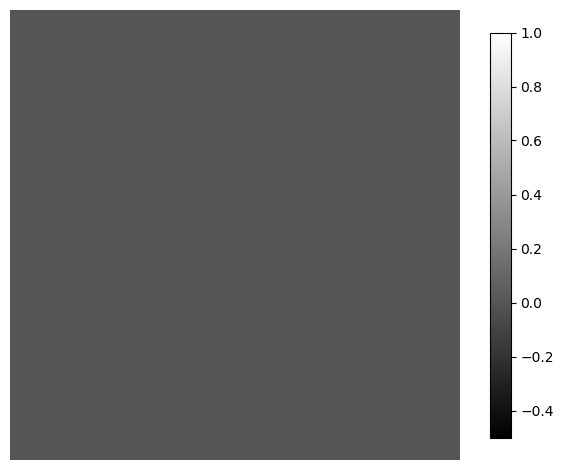

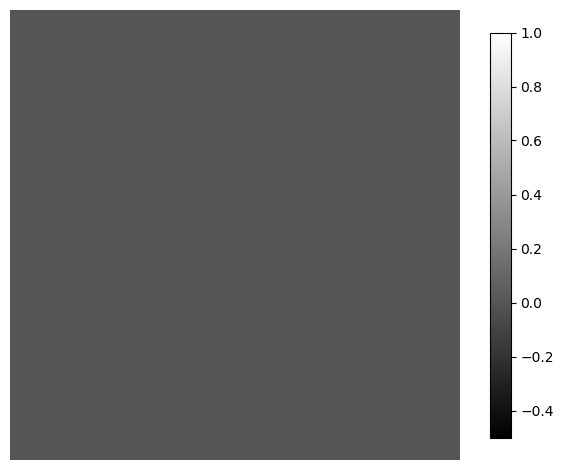

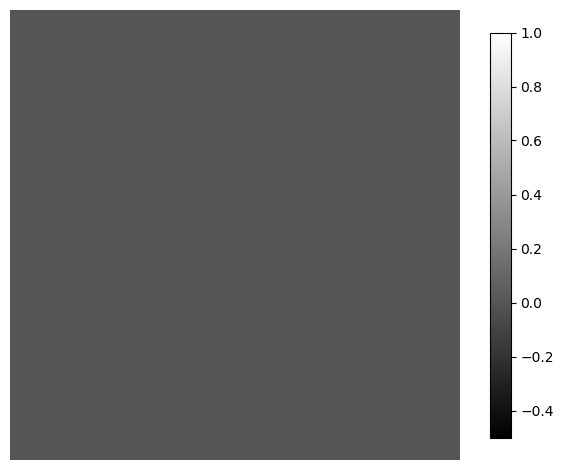

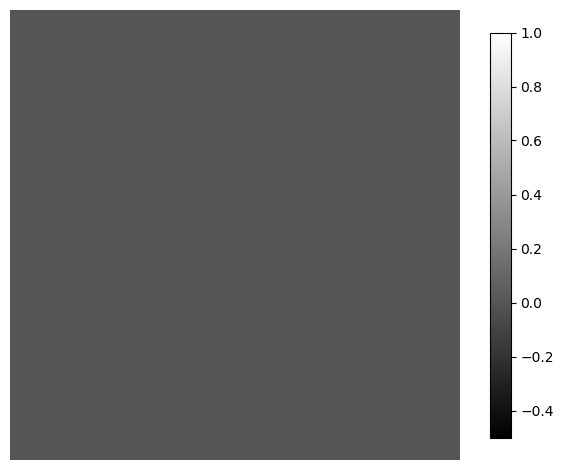

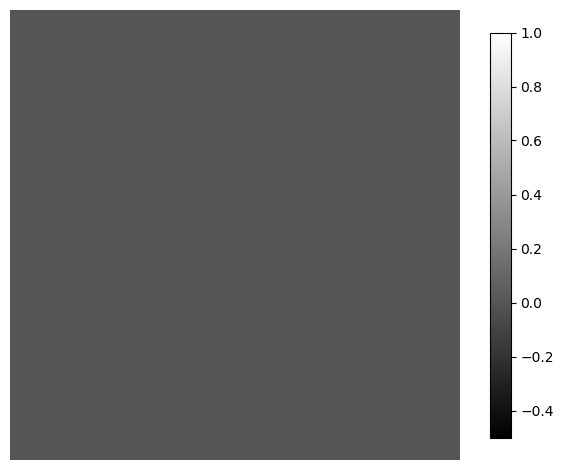

...

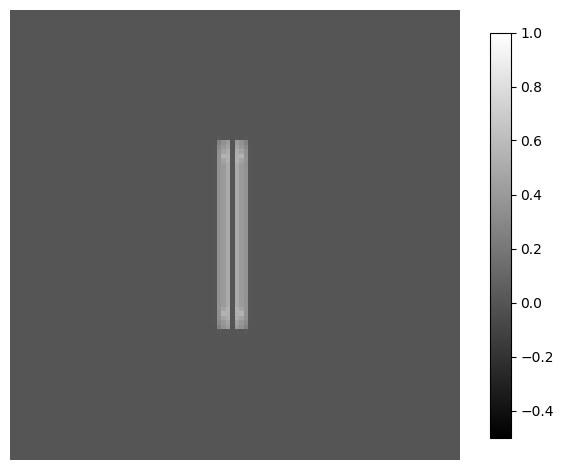

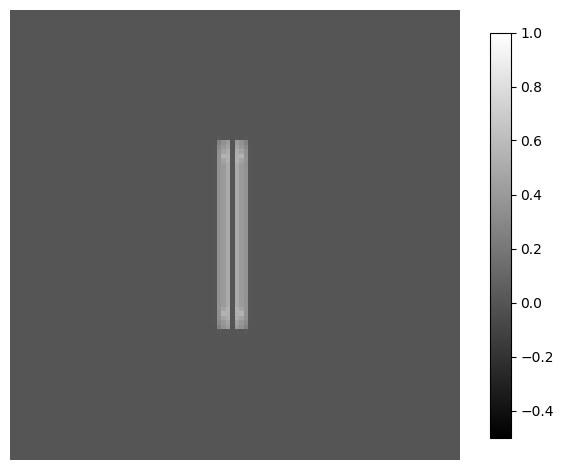

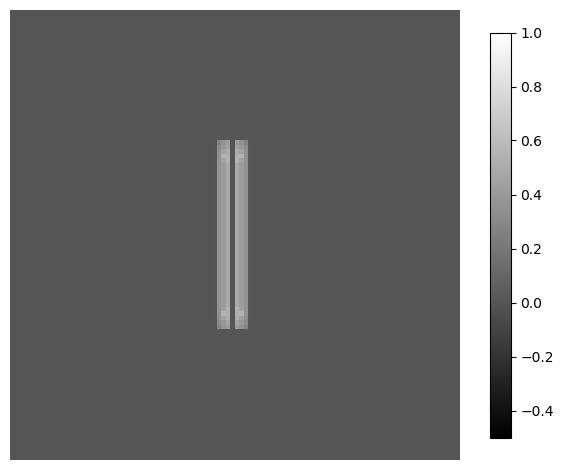

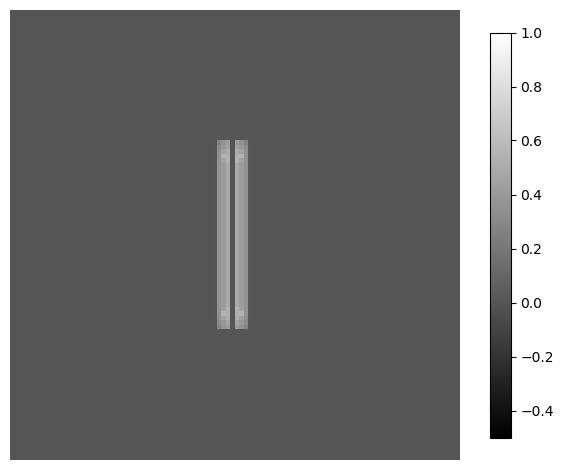

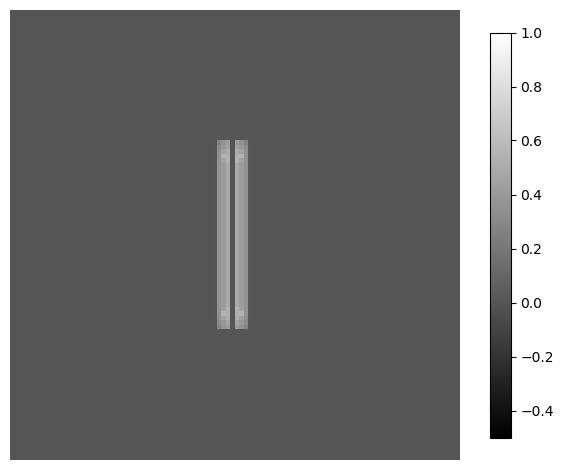

In [105]:
Utils.save_orientations_gs(sol[:,:,1,:], "x_k1", -0.5,1, true)

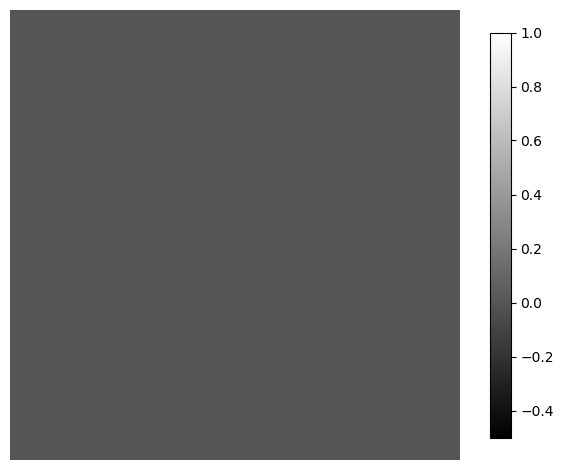

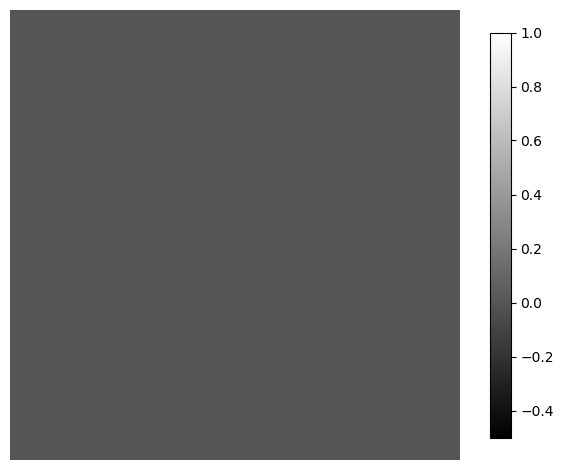

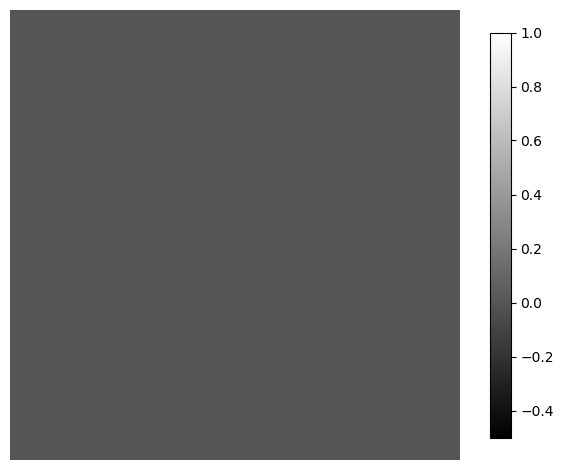

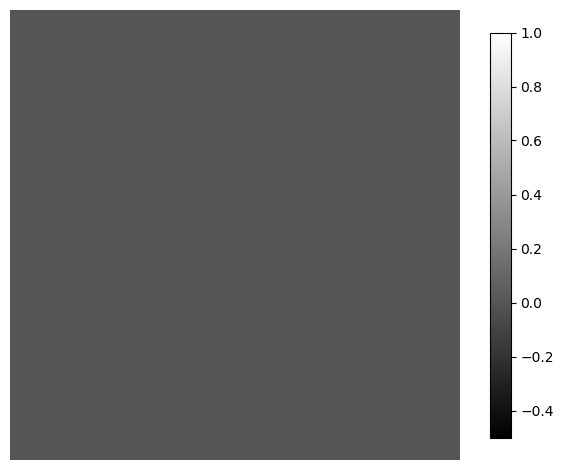

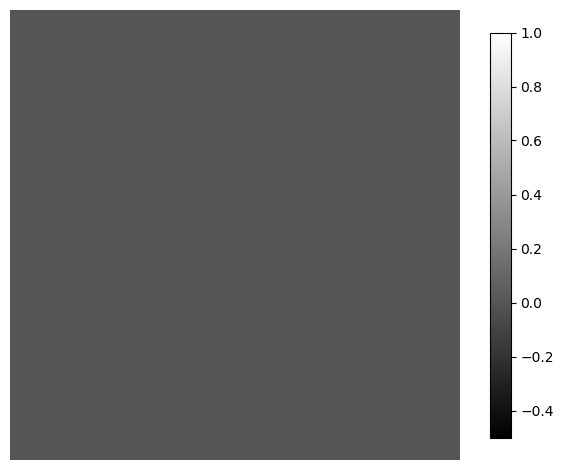

...

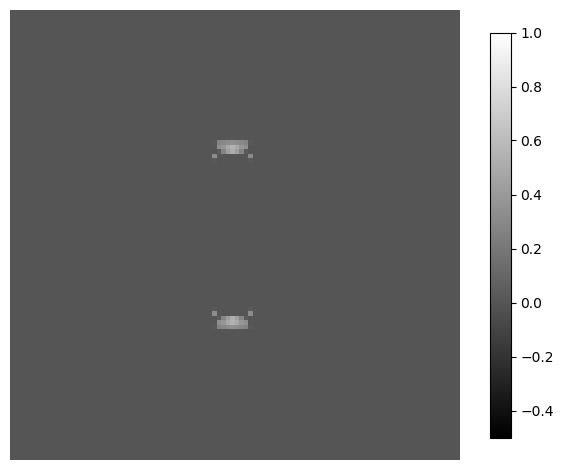

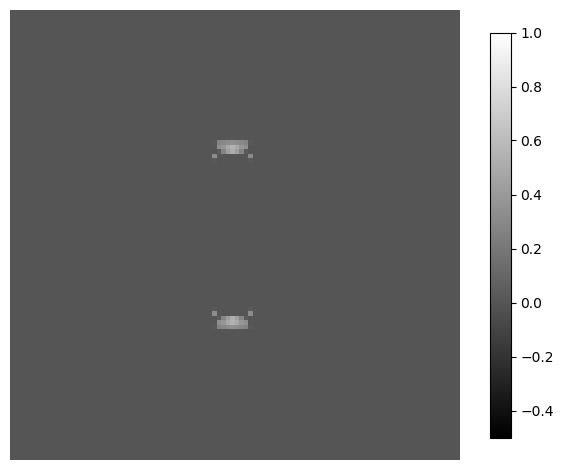

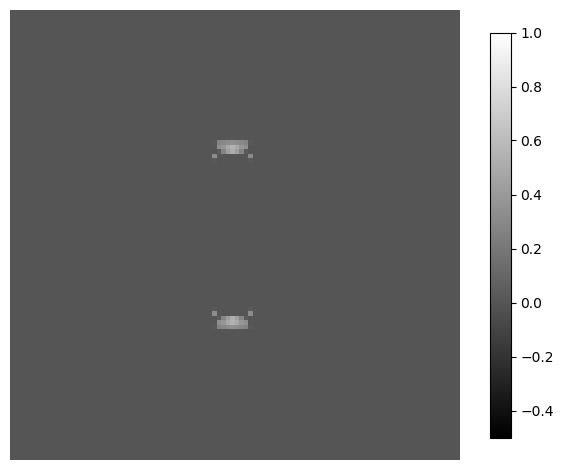

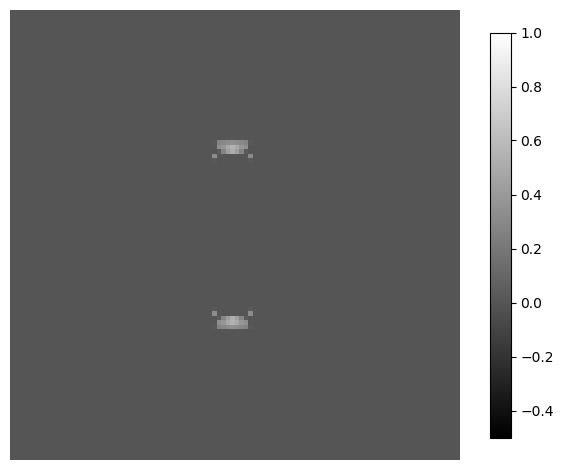

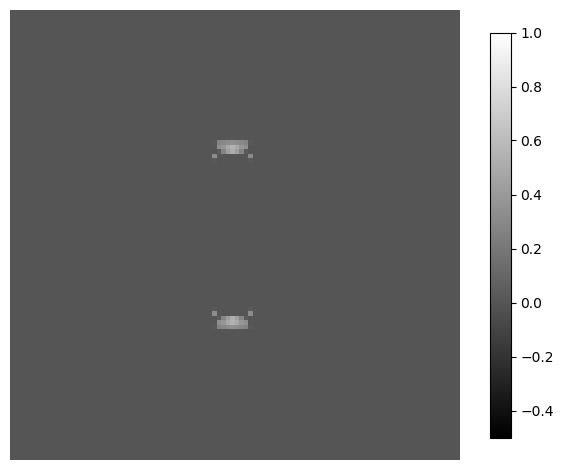

In [106]:
Utils.save_orientations_gs(sol[:,:,2,:], "x_k2", -0.5,1, true)

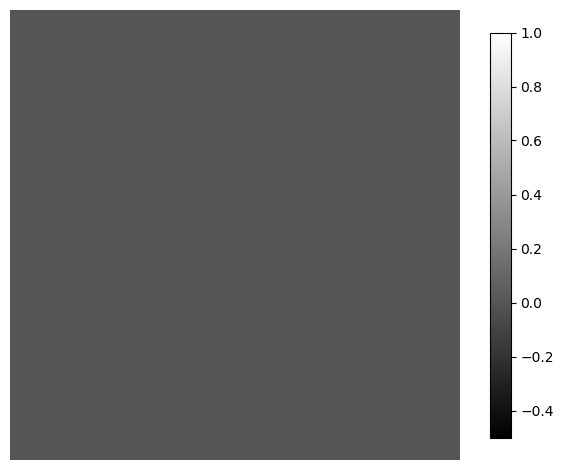

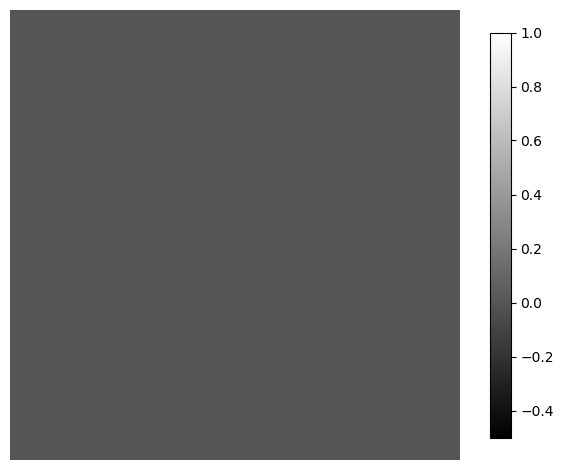

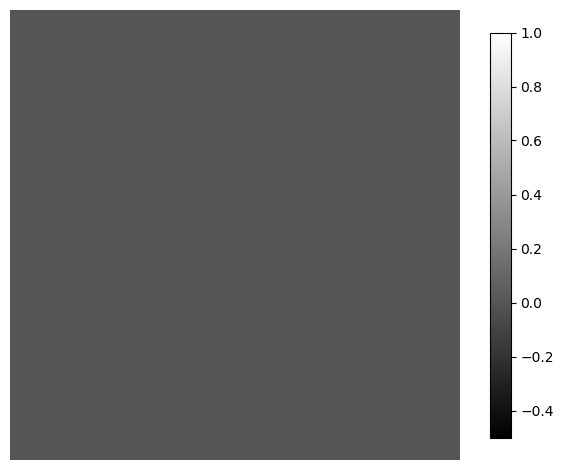

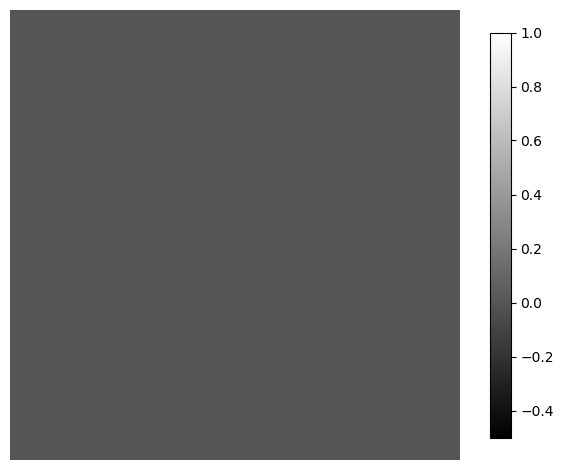

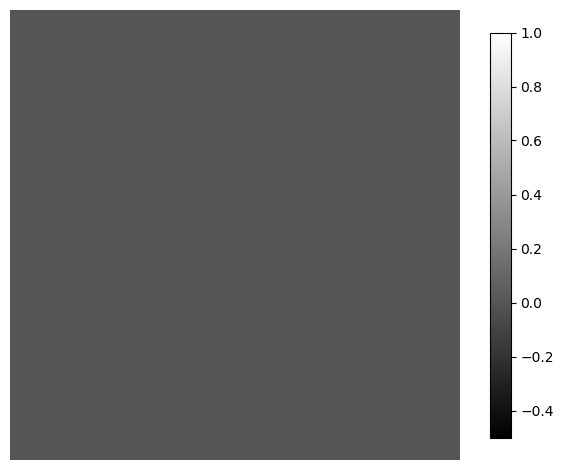

...

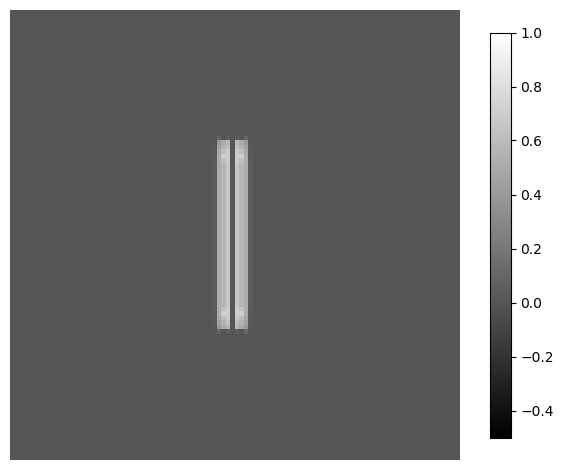

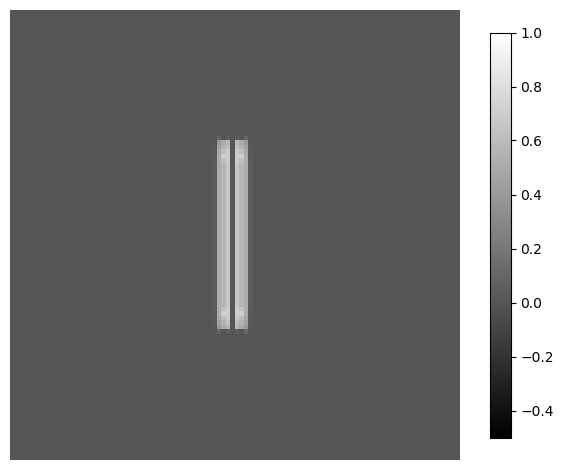

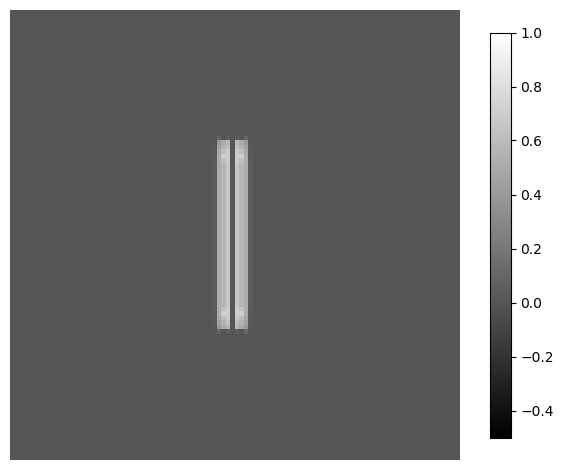

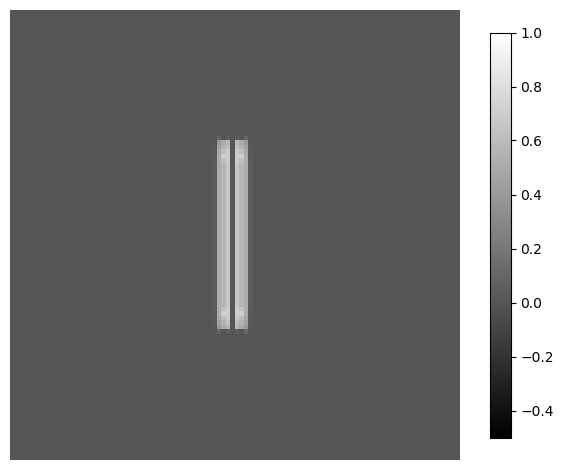

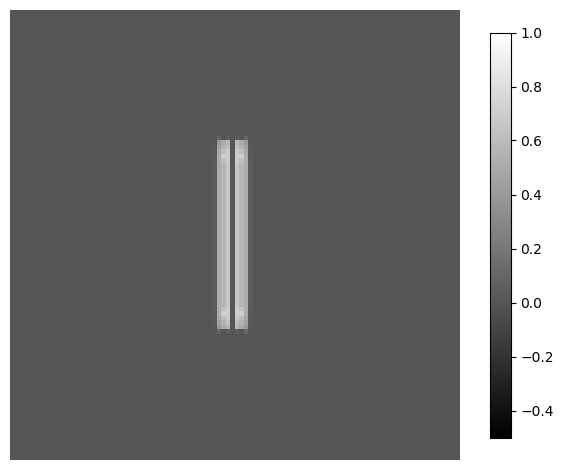

In [107]:
Utils.save_orientations_gs(sol[:,:,3,:], "y_k1", -0.5,1, true)

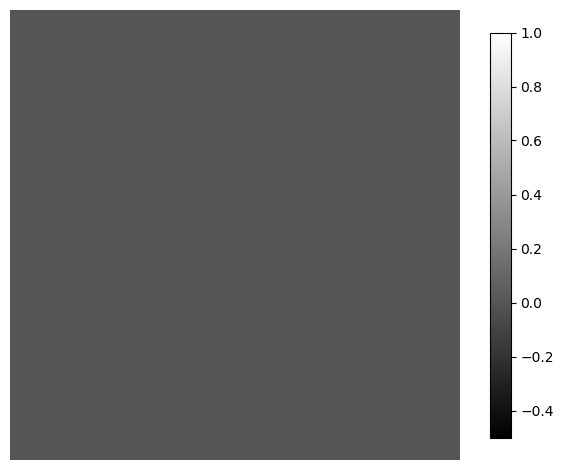

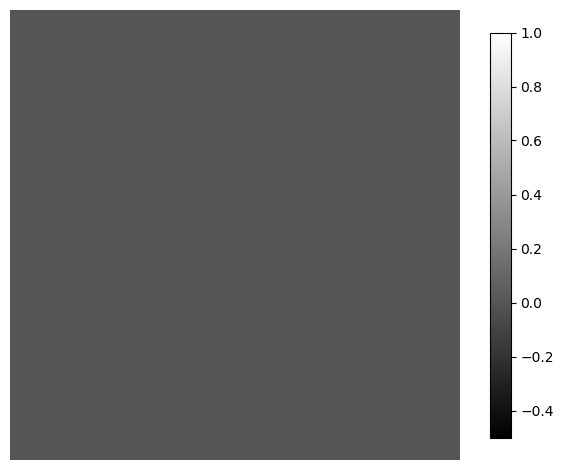

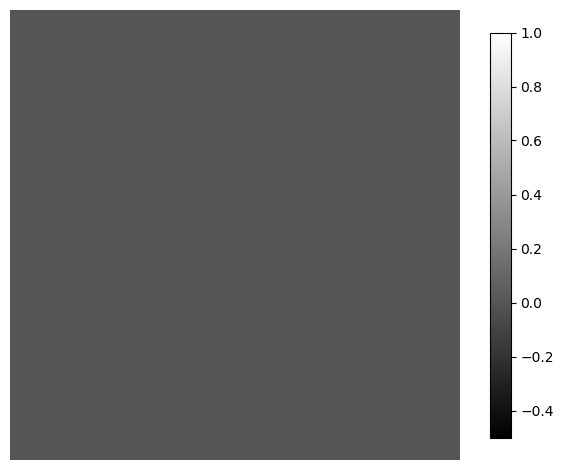

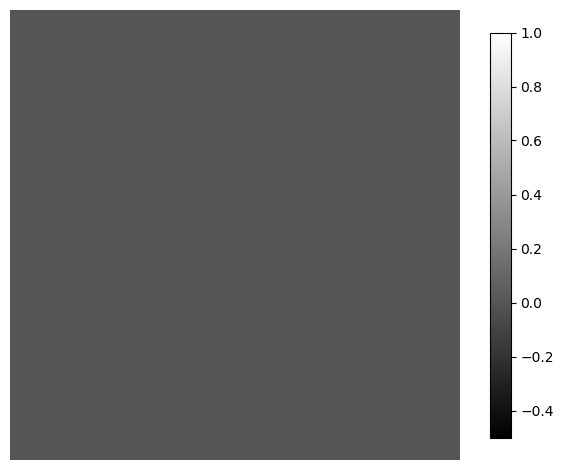

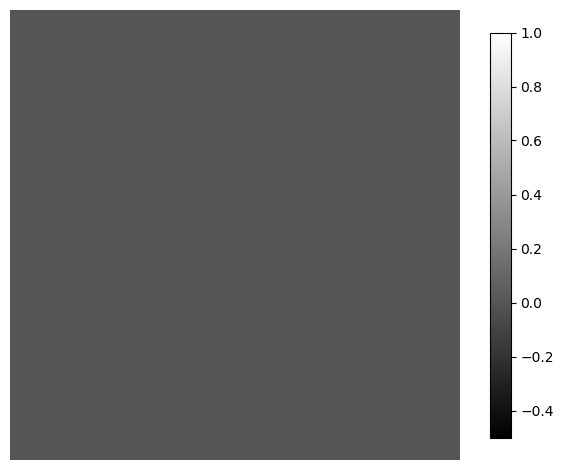

...

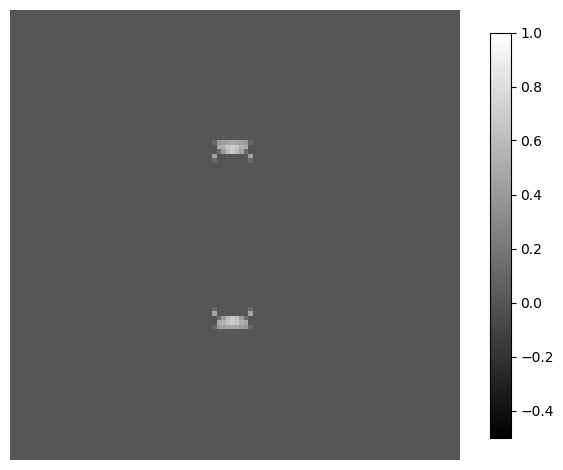

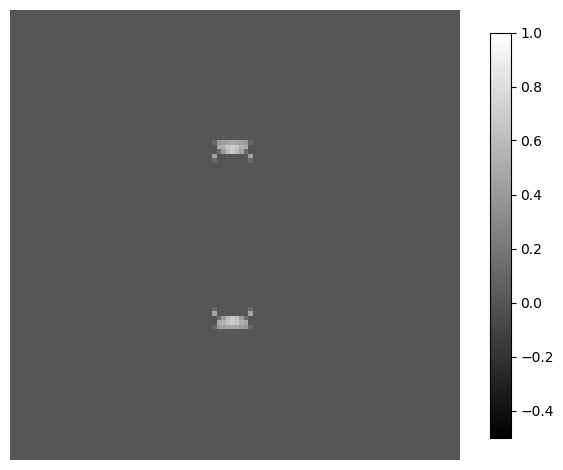

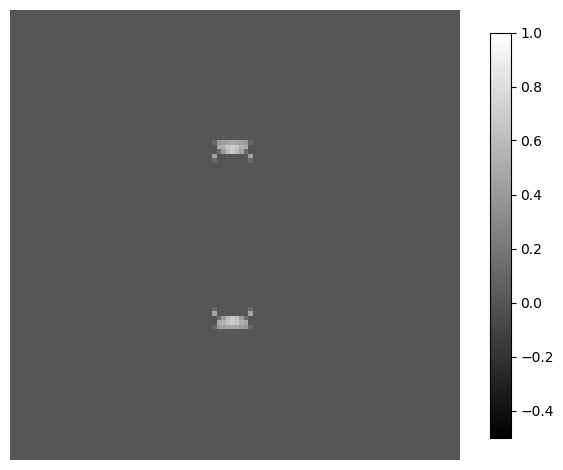

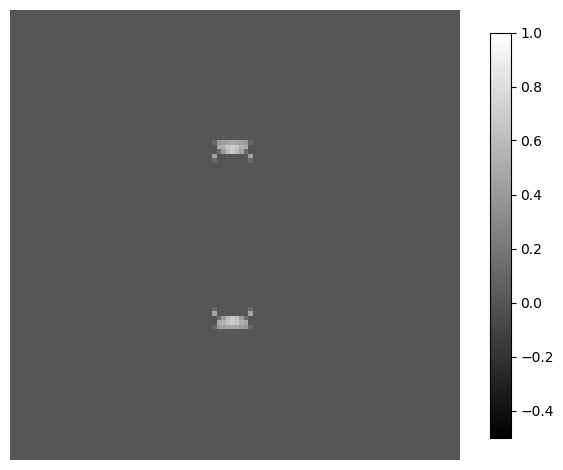

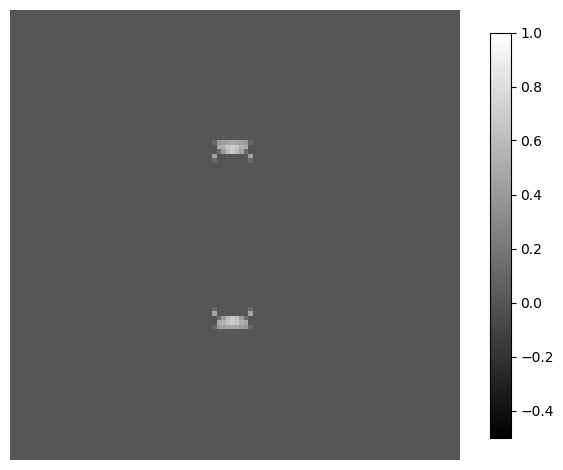

In [108]:
Utils.save_orientations_gs(sol[:,:,4,:], "y_k2", -0.5,1, true)

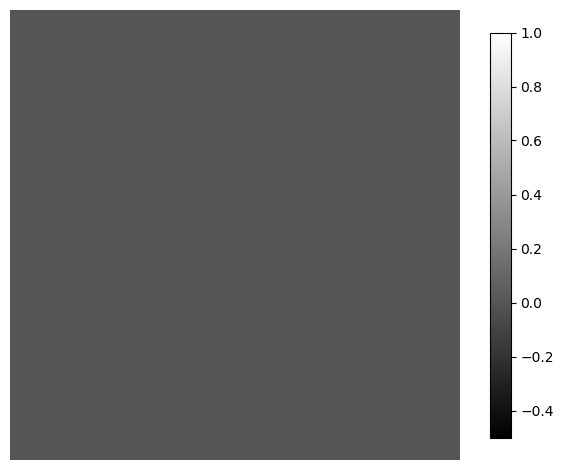

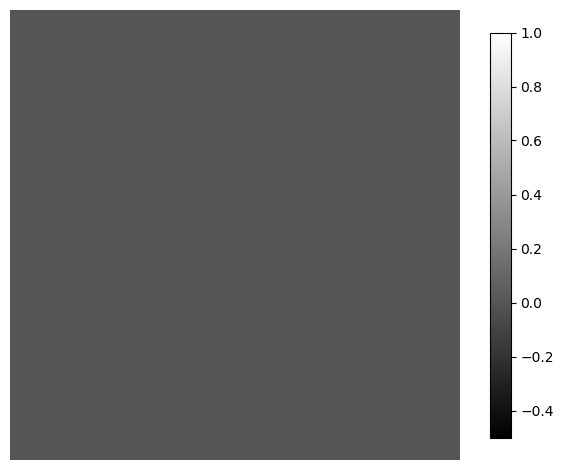

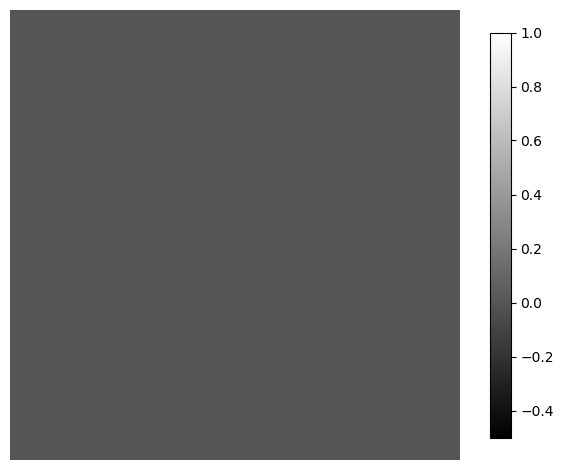

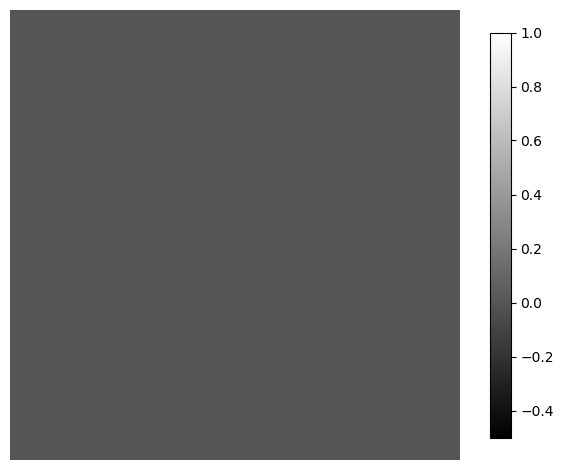

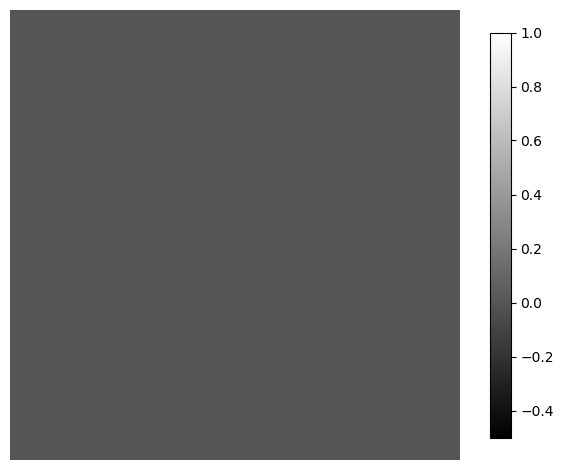

...

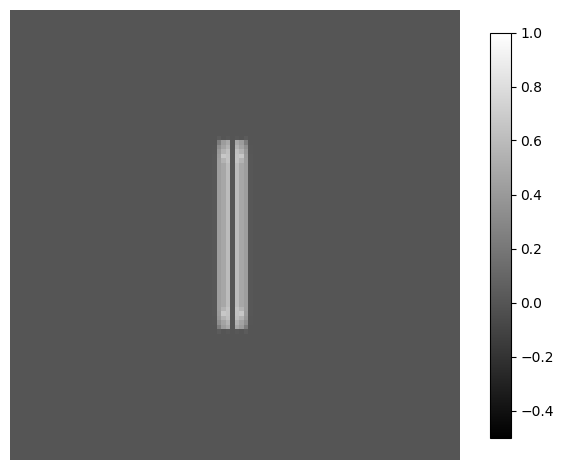

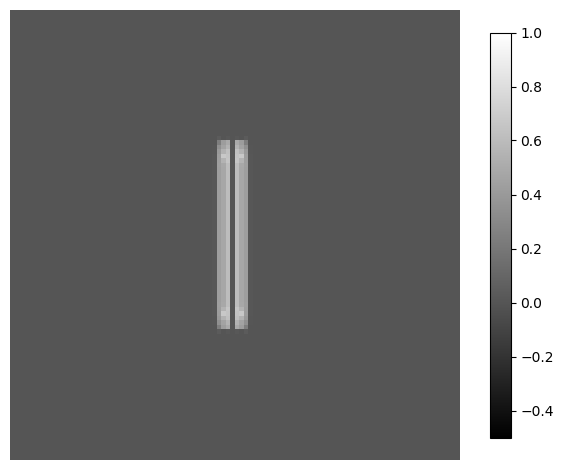

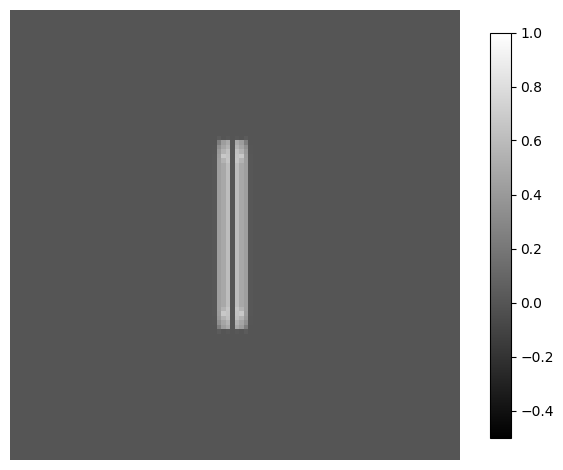

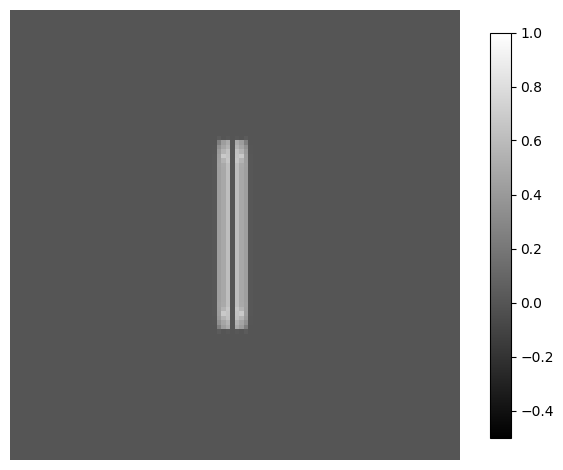

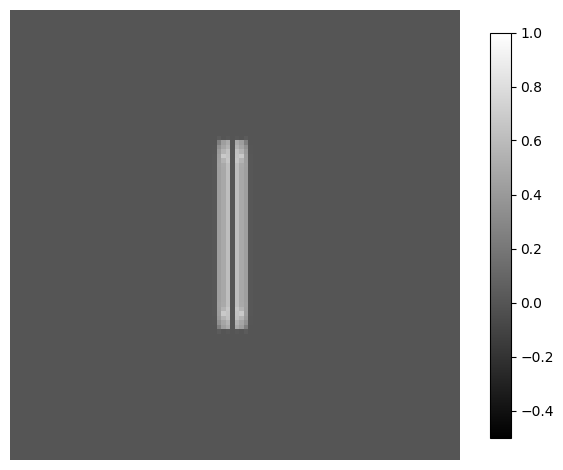

In [109]:
Utils.save_orientations_gs(sol[:,:,5,:], "m_k1", -0.5,1, true)

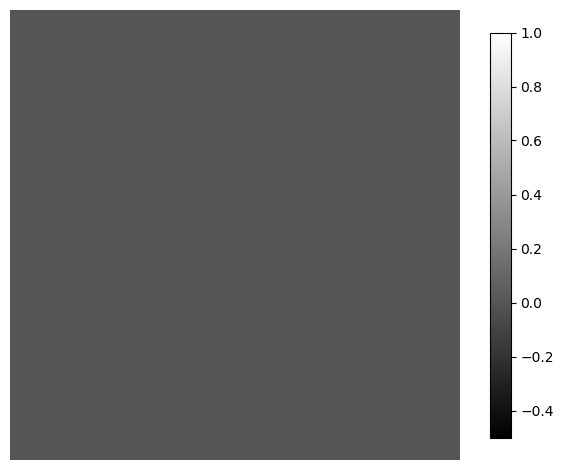

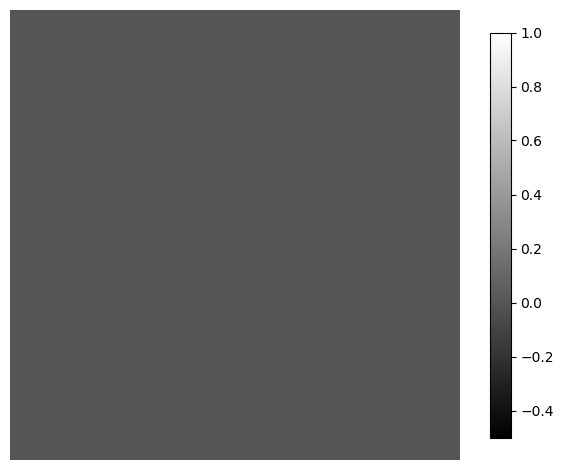

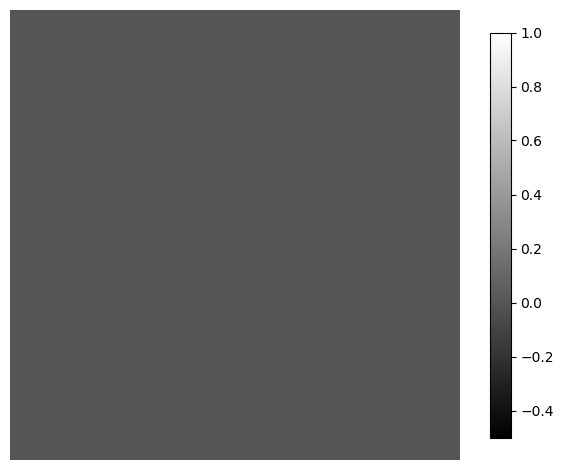

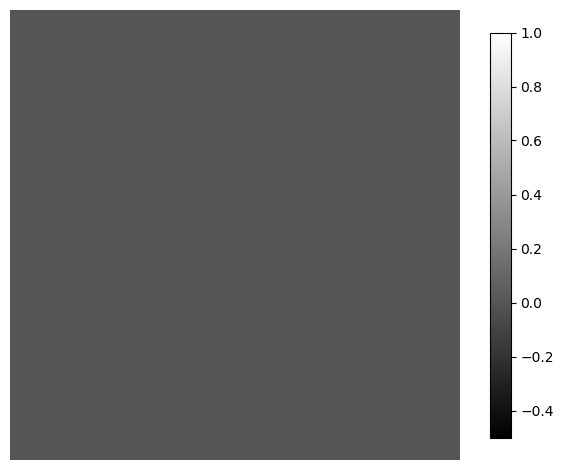

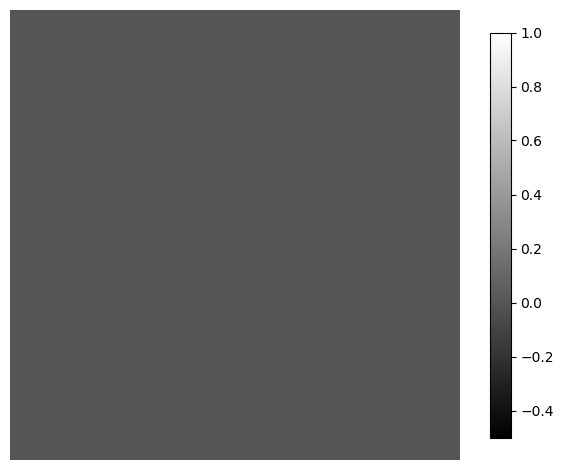

...

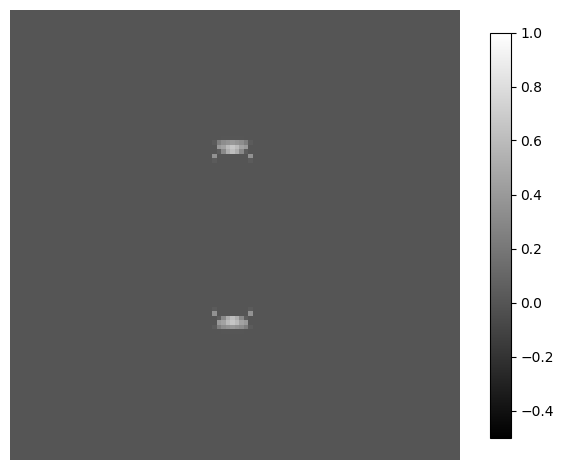

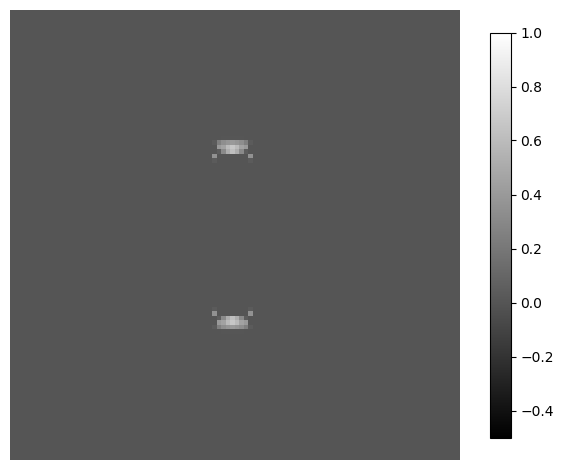

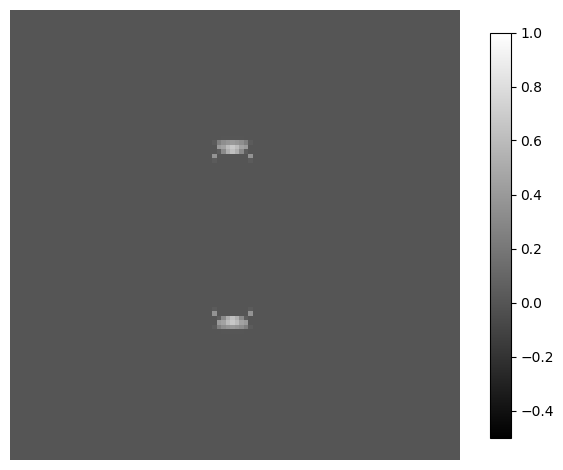

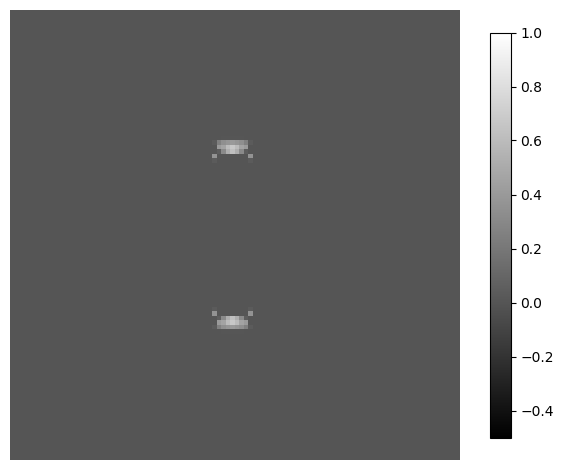

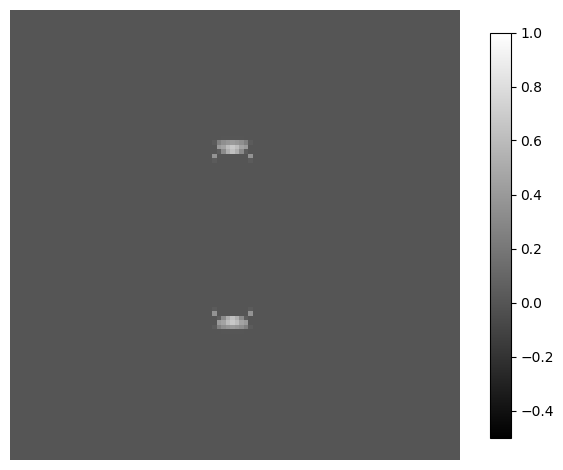

In [110]:
Utils.save_orientations_gs(sol[:,:,6,:], "m_k2", -0.5,1, true)

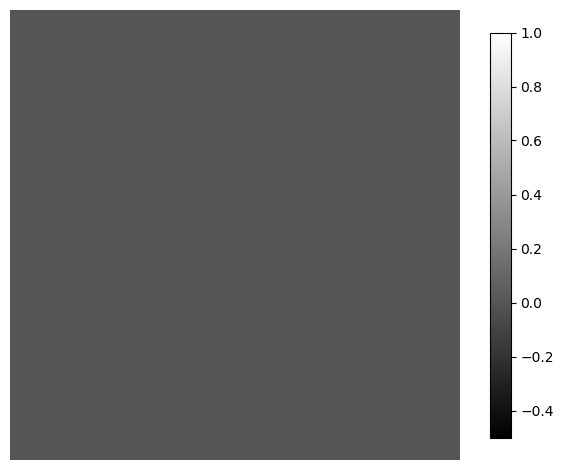

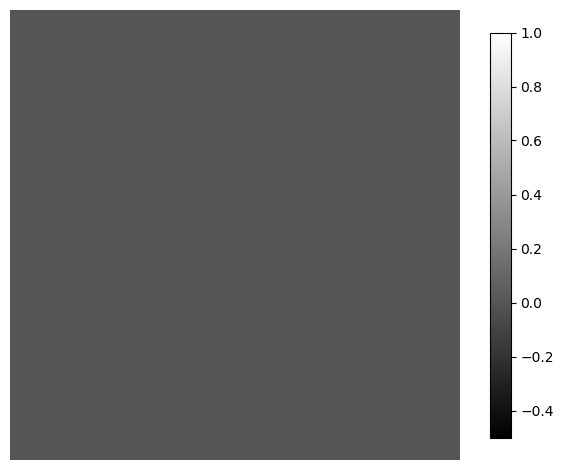

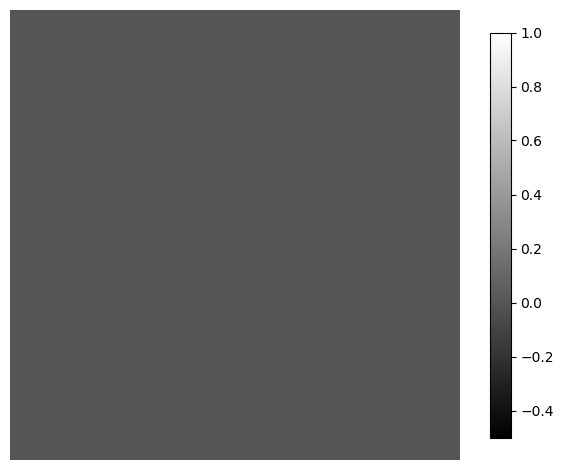

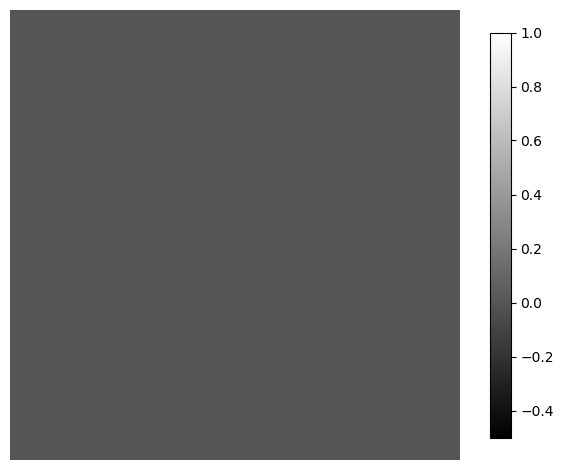

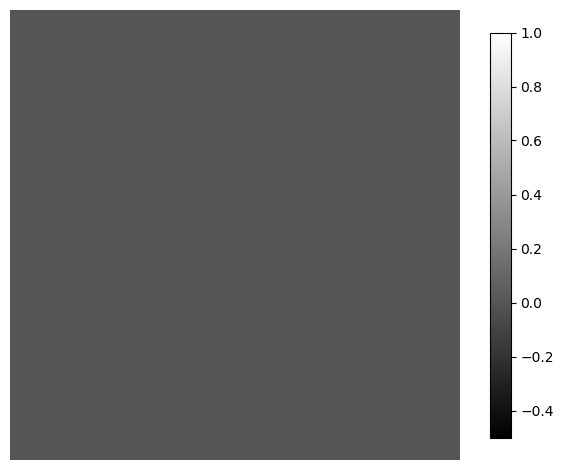

...

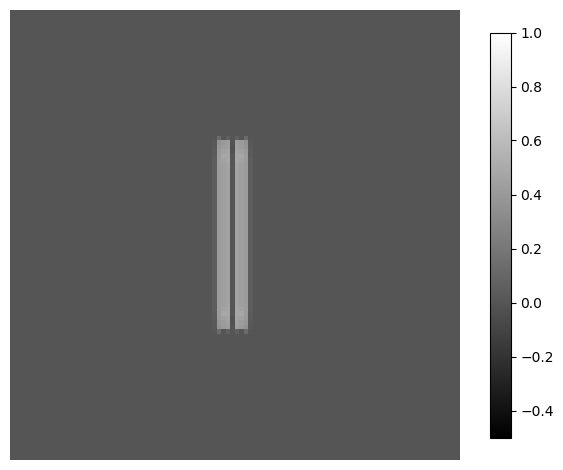

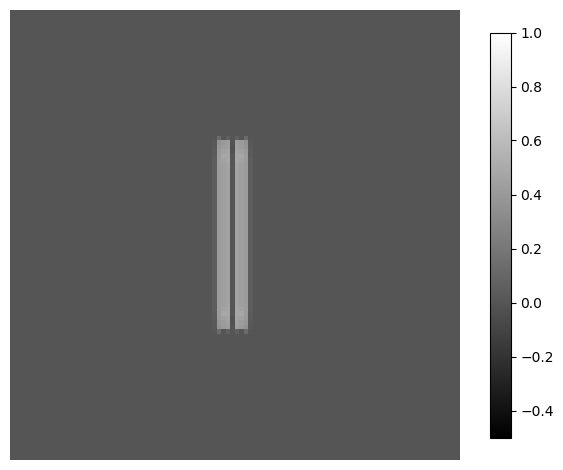

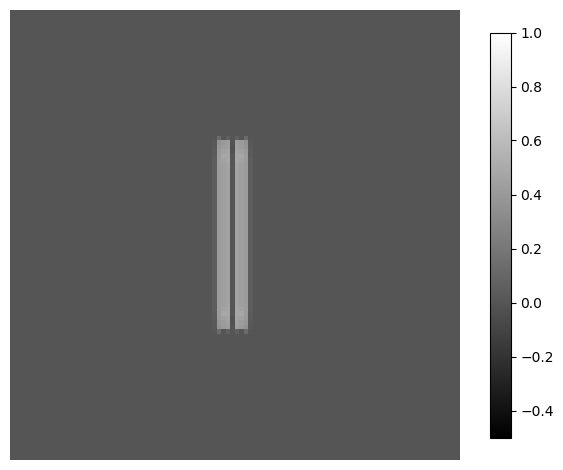

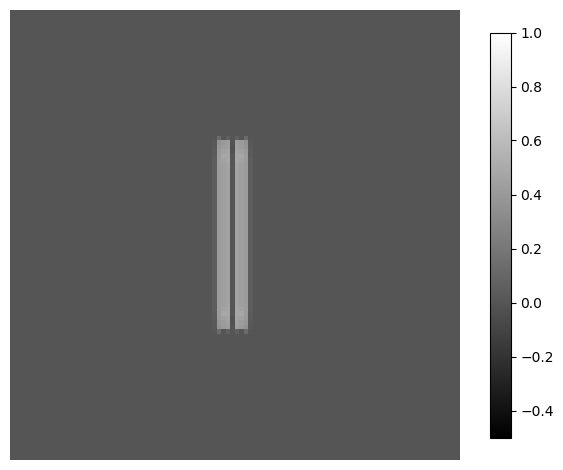

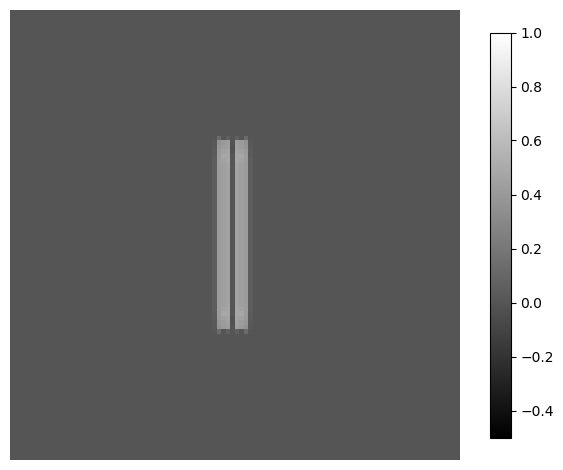

In [111]:
Utils.save_orientations_gs(sol[:,:,7,:], "z_k1", -0.5,1, true)

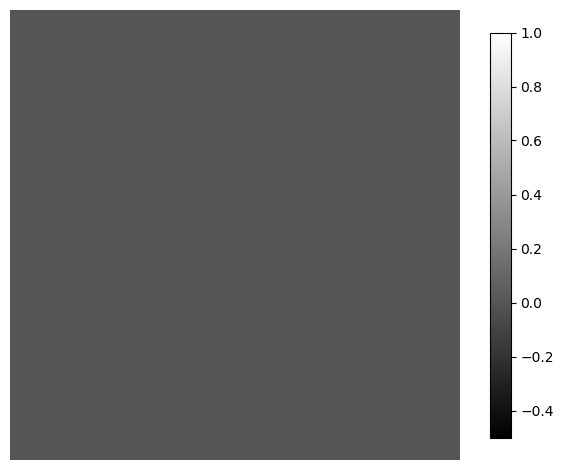

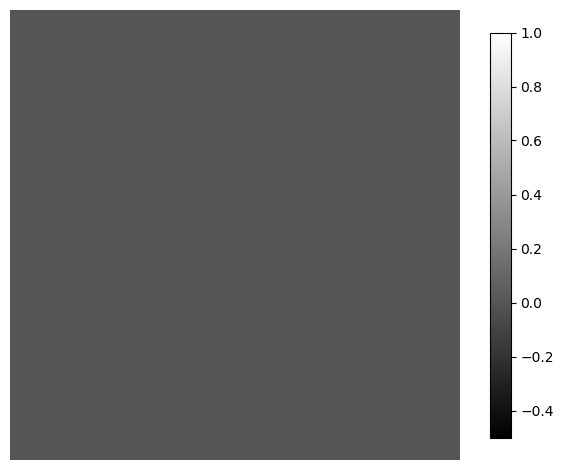

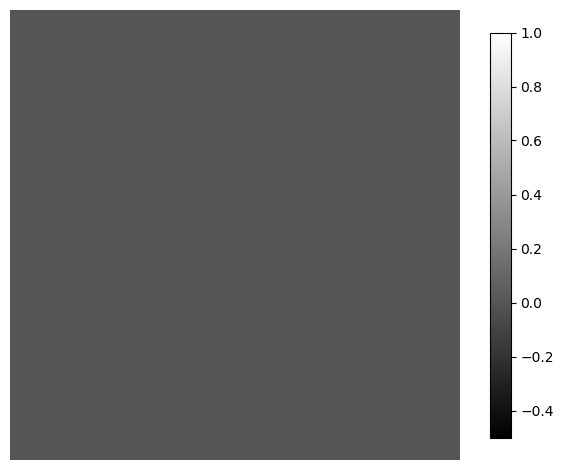

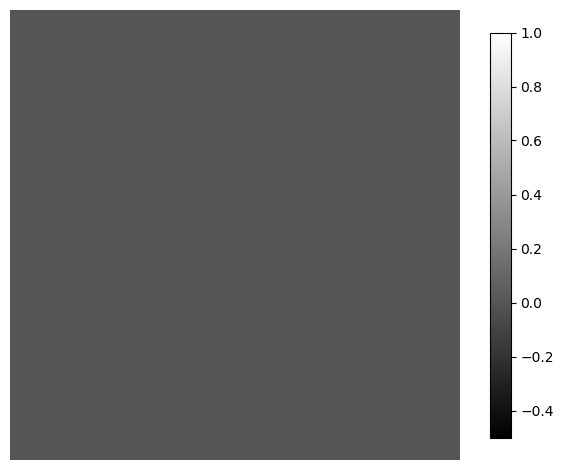

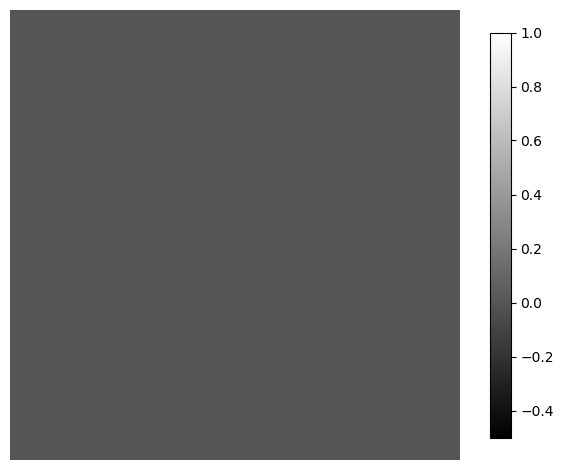

...

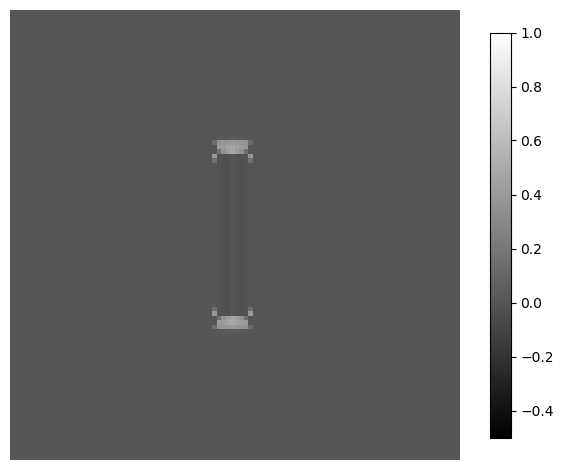

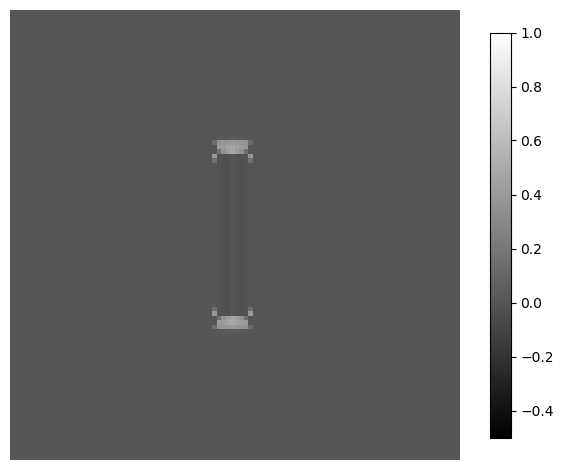

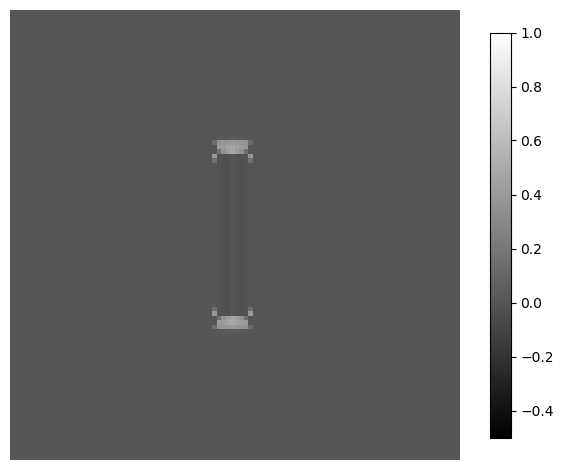

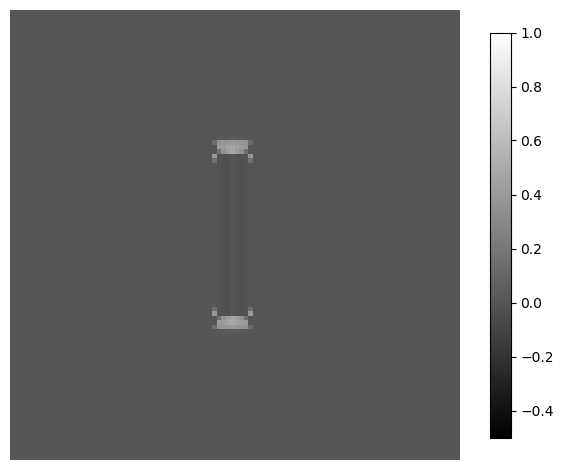

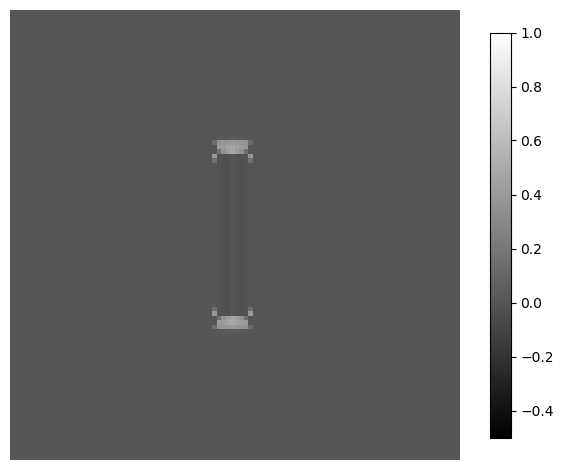

In [112]:
Utils.save_orientations_gs(sol[:,:,8,:], "z_k2", -0.5,1, true)

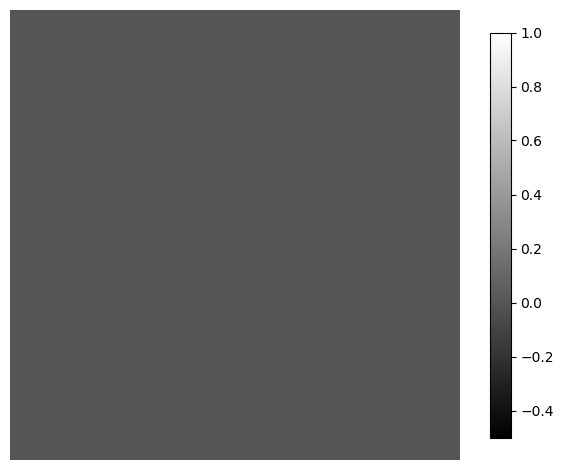

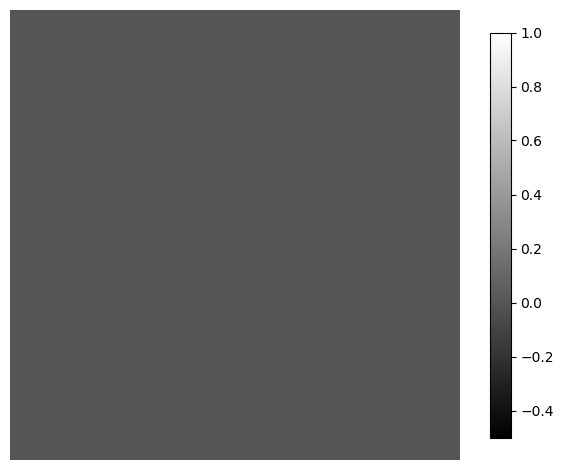

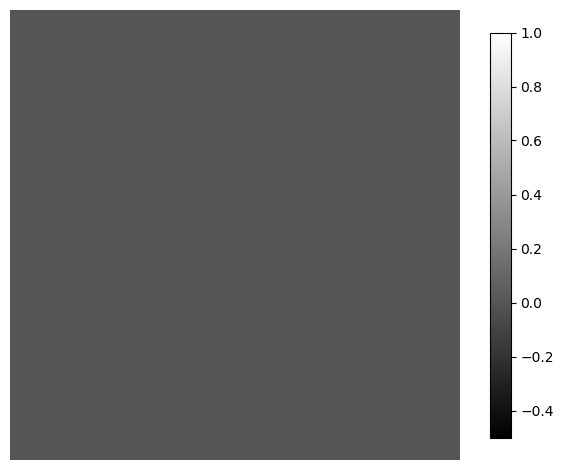

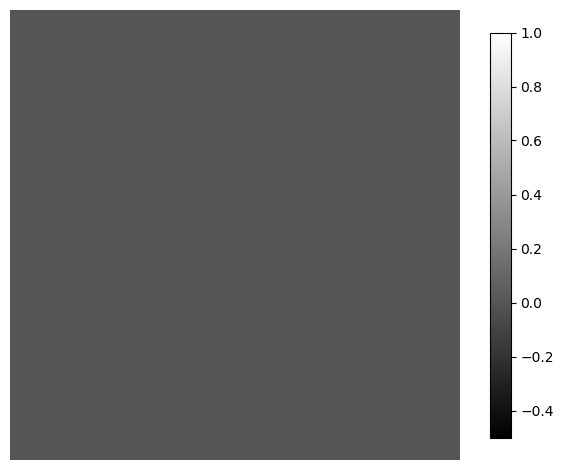

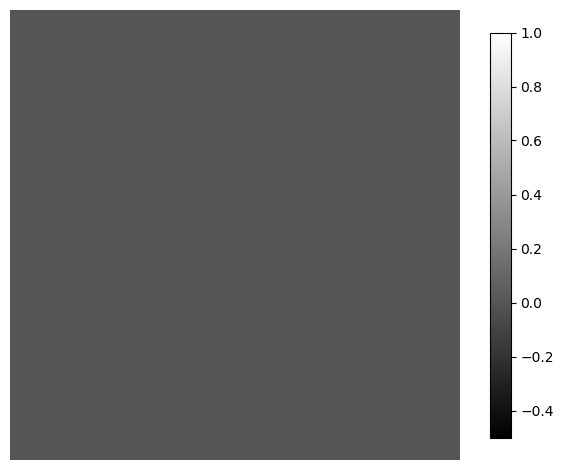

...

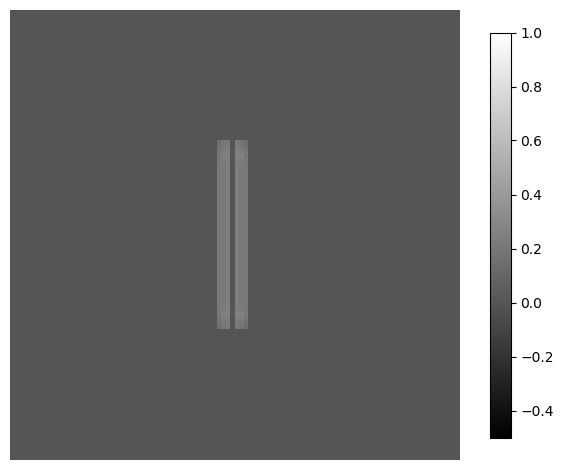

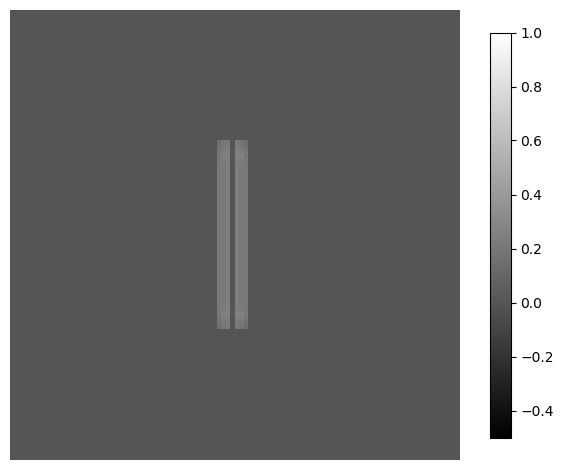

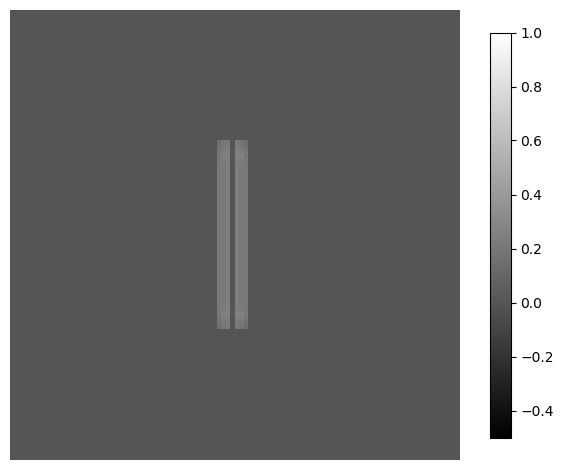

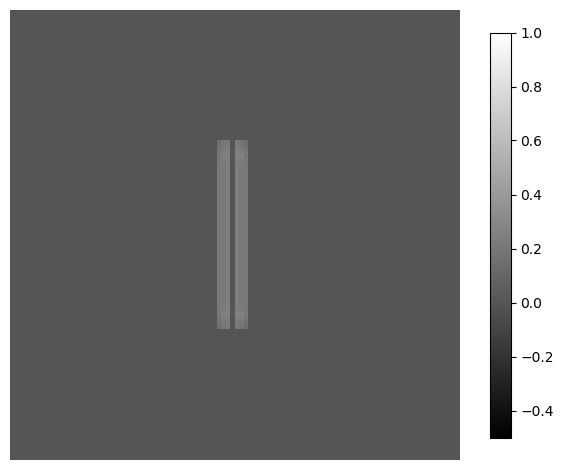

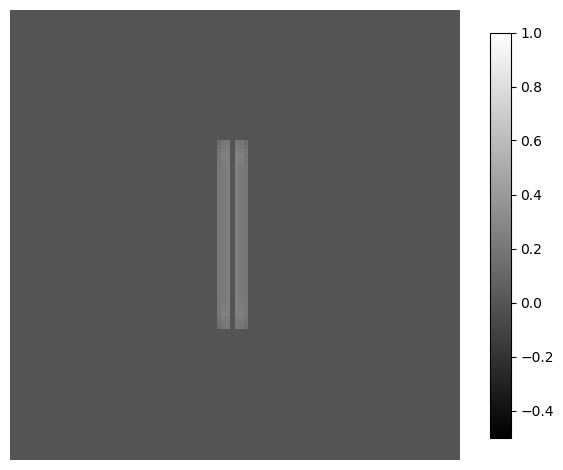

In [113]:
Utils.save_orientations_gs(sol[:,:,9,:], "s_k1", -0.5,1, true)

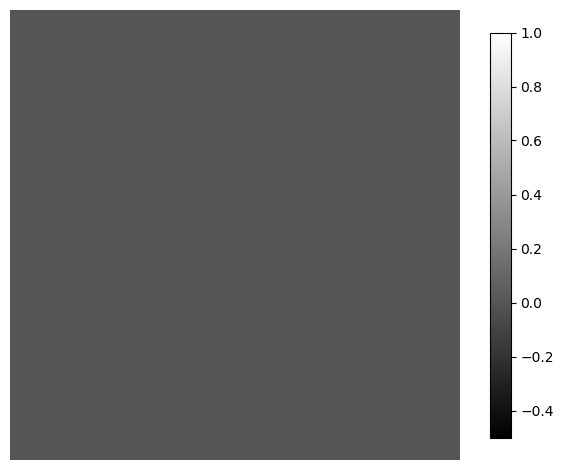

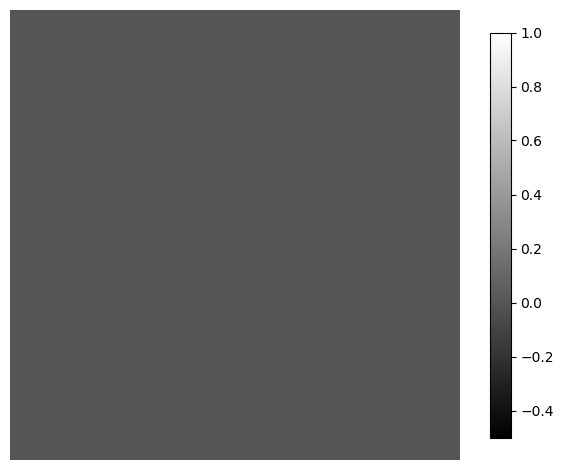

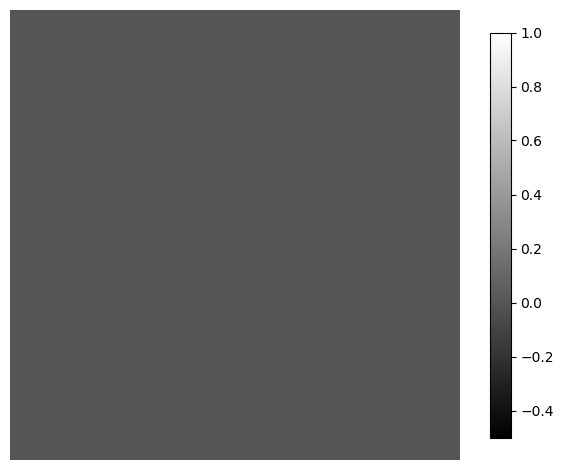

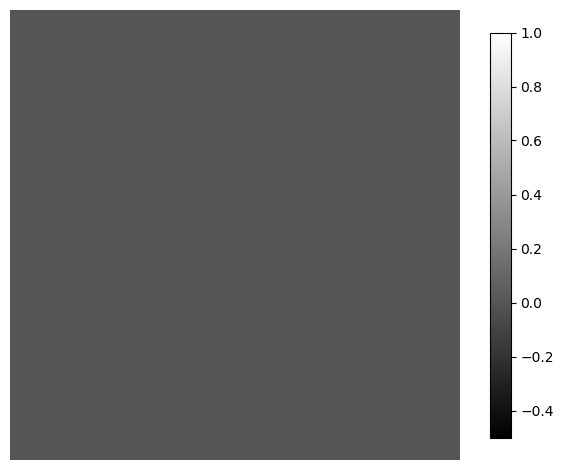

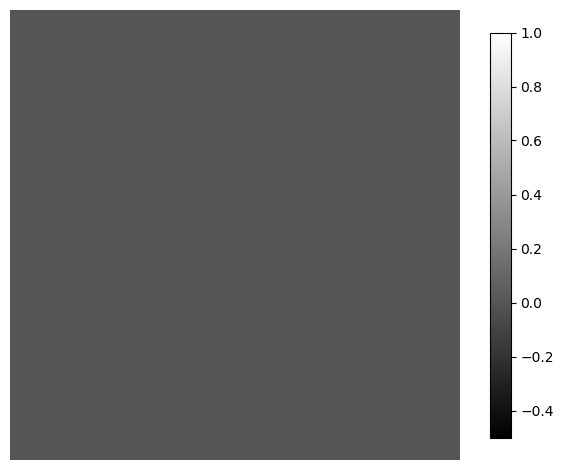

...

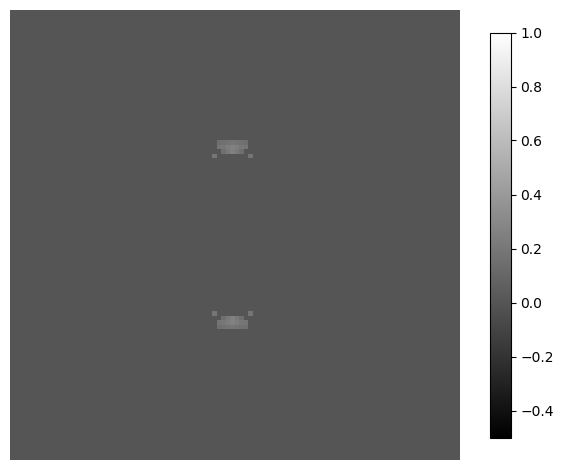

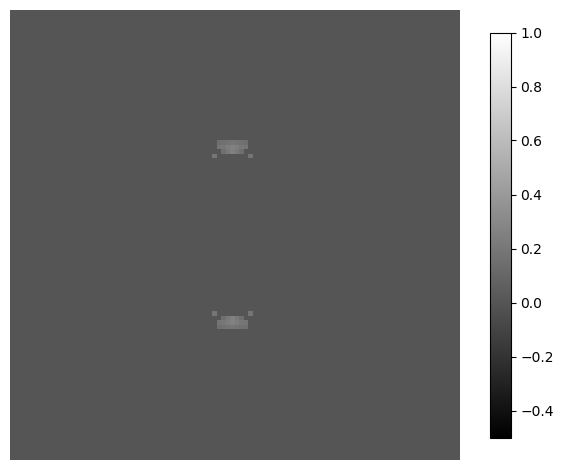

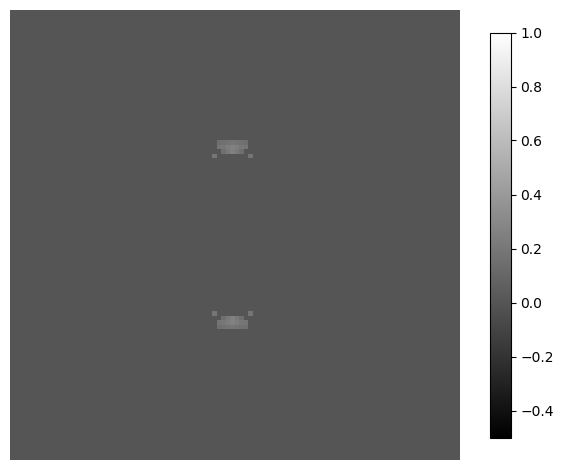

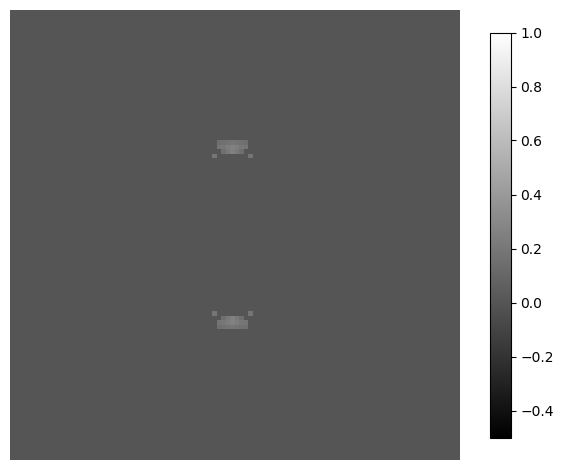

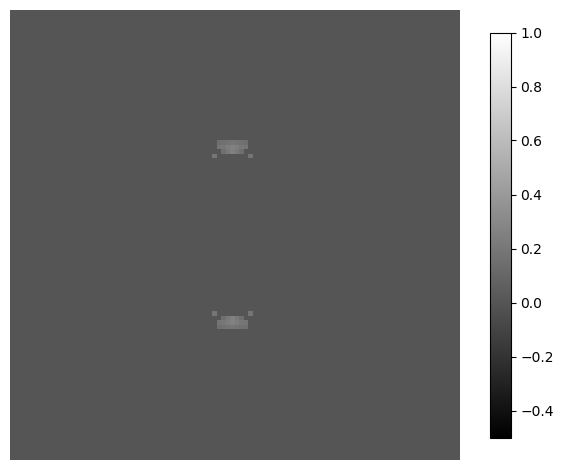

In [114]:
Utils.save_orientations_gs(sol[:,:,10,:], "s_k2", -0.5,1, true)

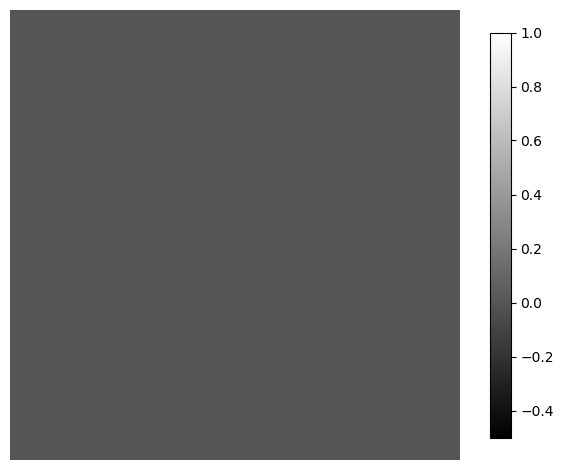

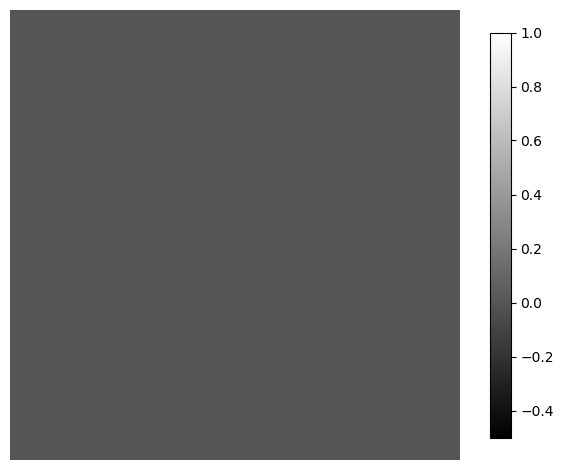

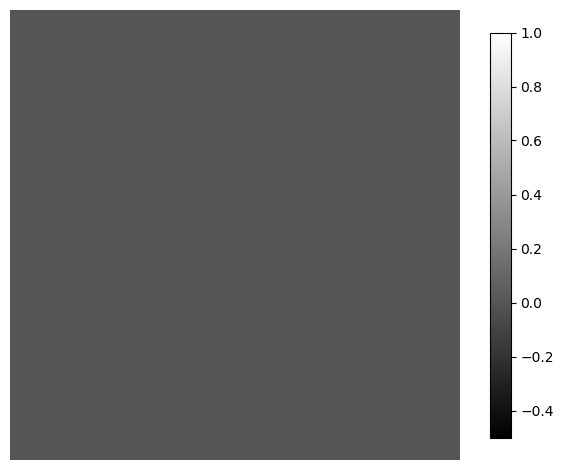

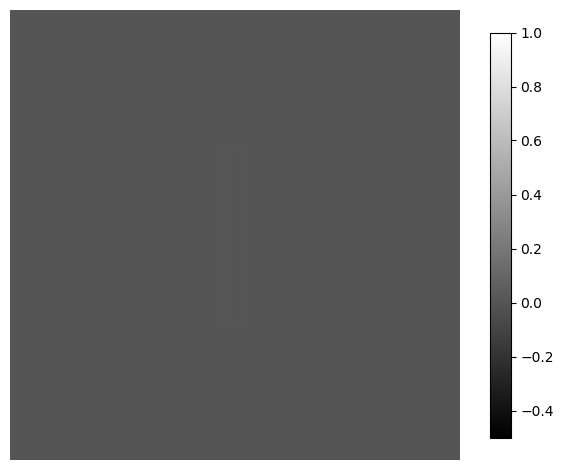

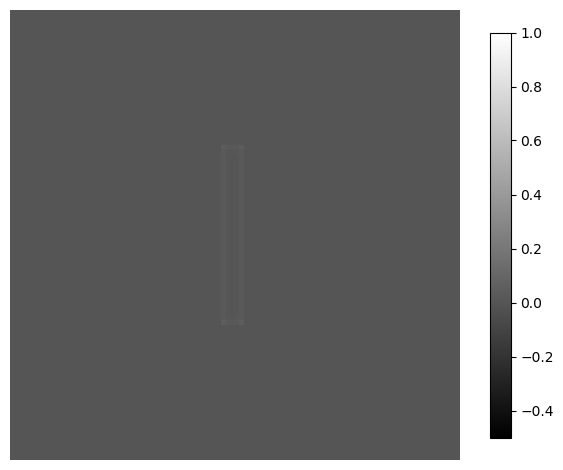

...

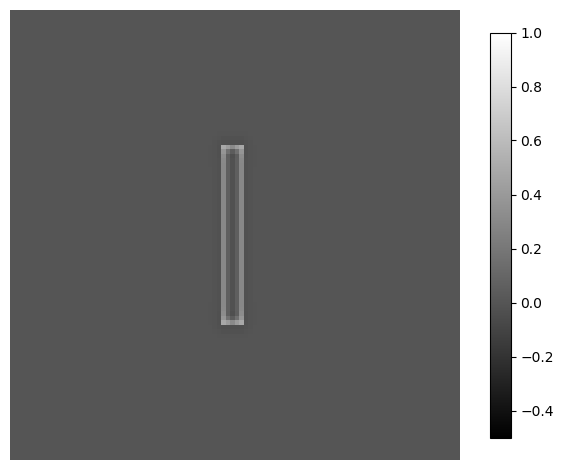

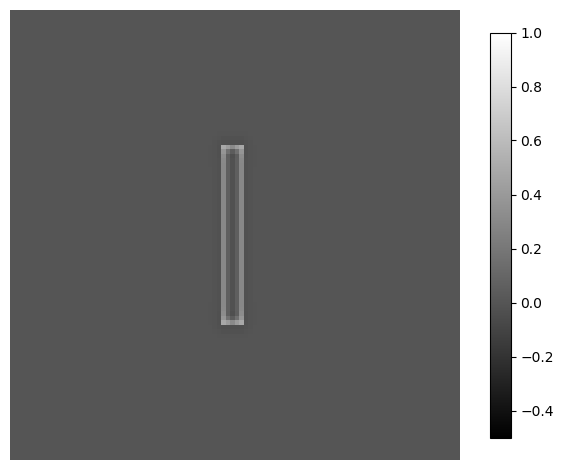

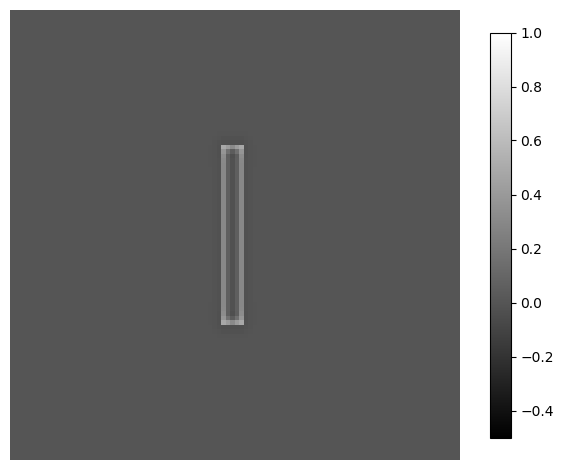

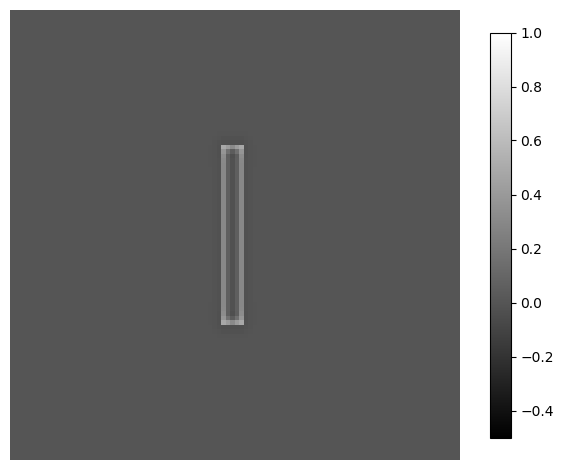

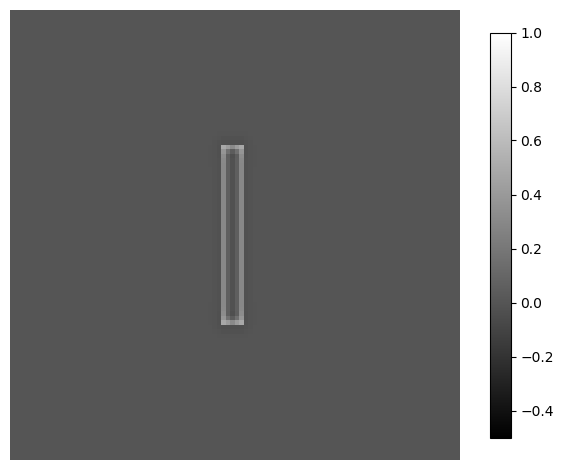

In [115]:
Utils.save_orientations_gs(sol[:,:,11,:], "v_p", -0.5,1, true)

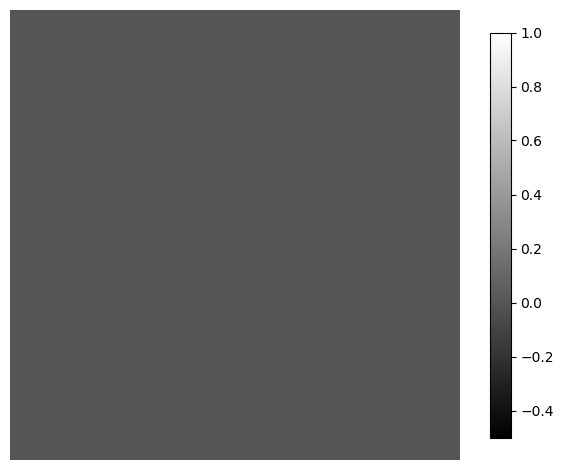

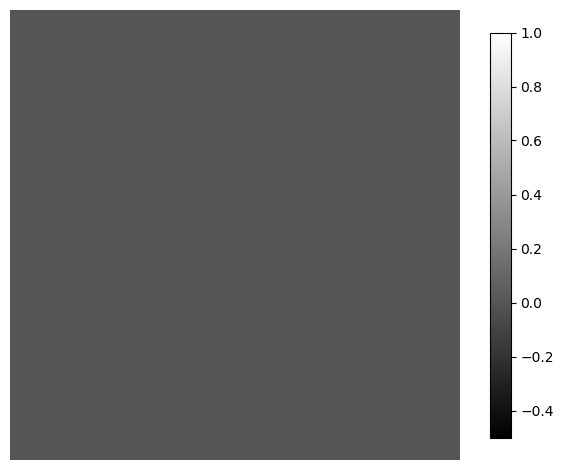

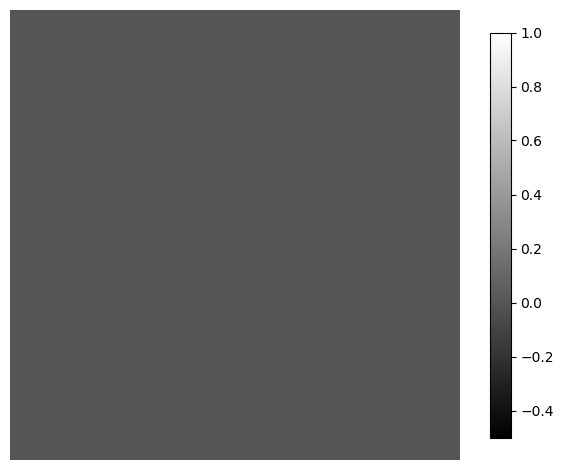

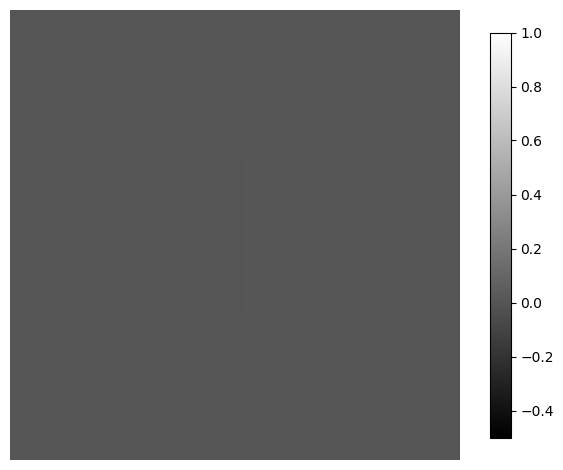

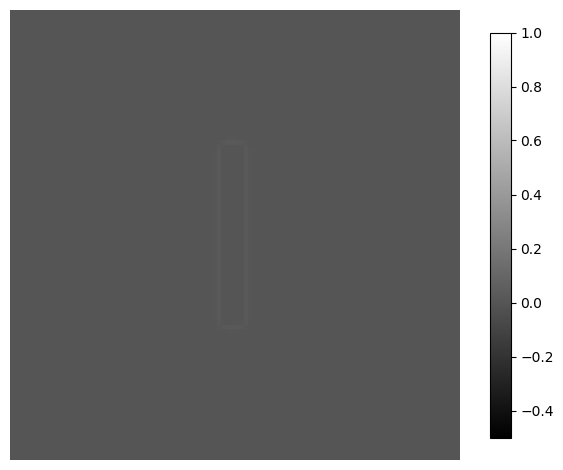

...

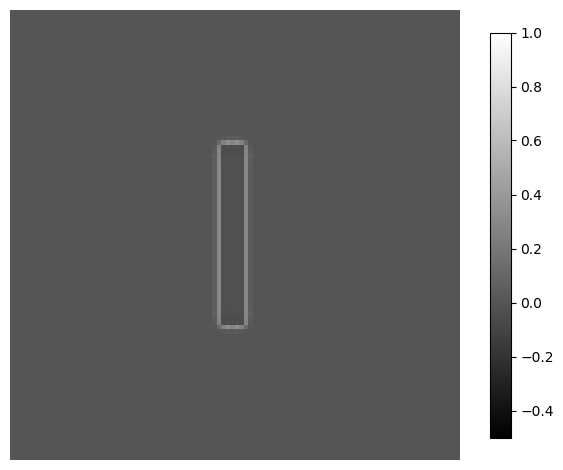

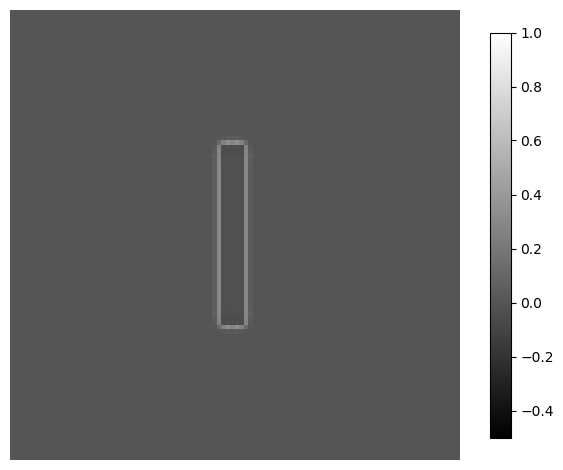

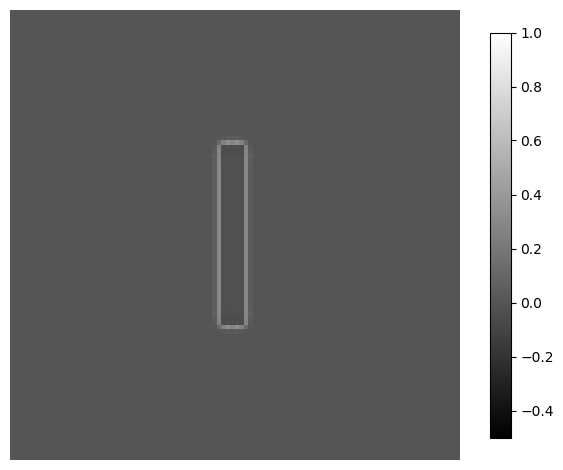

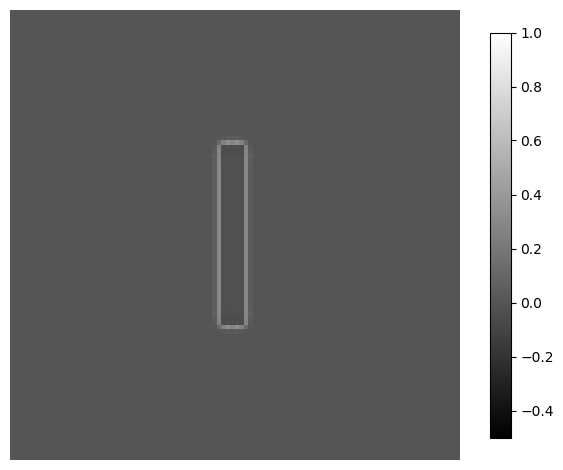

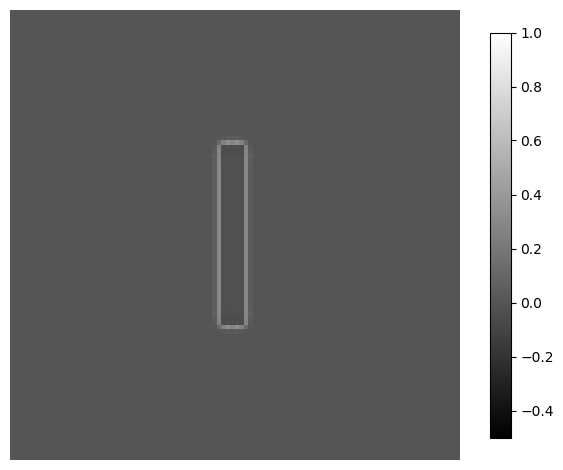

In [116]:
Utils.save_orientations_gs(sol[:,:,12,:], "v_m", -0.5,1, true)

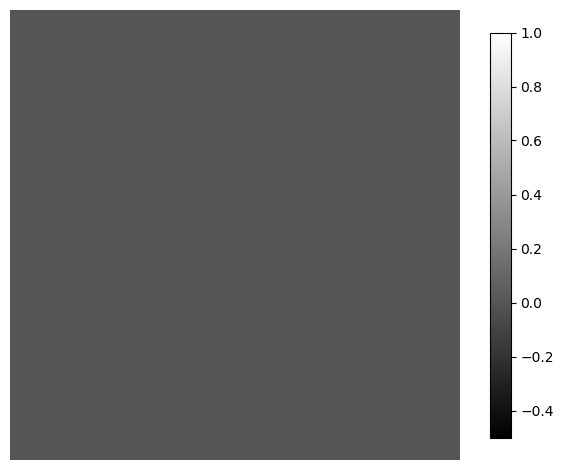

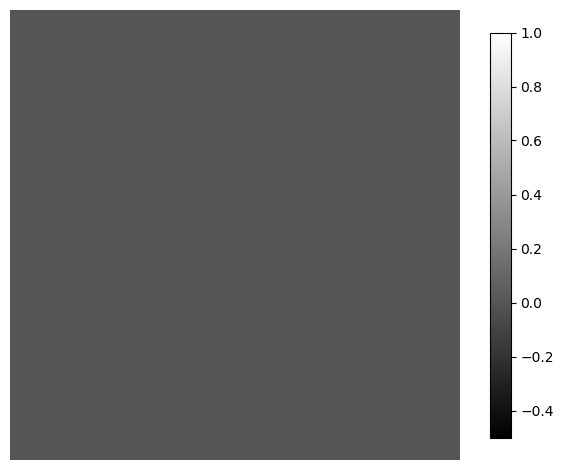

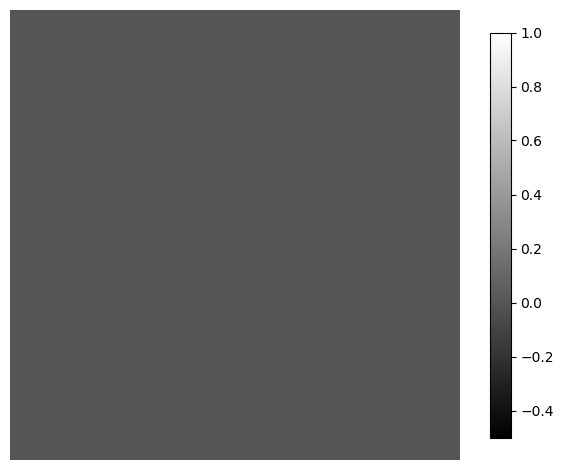

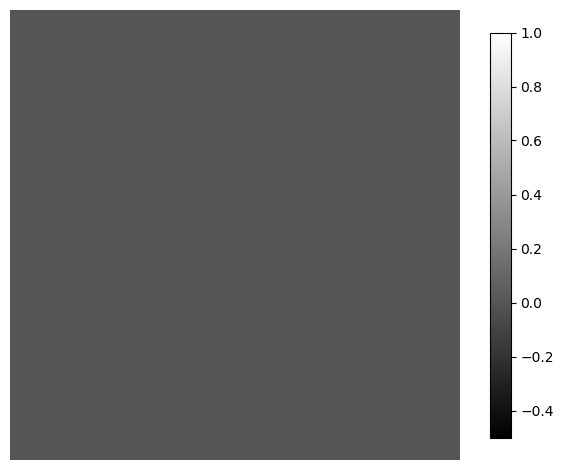

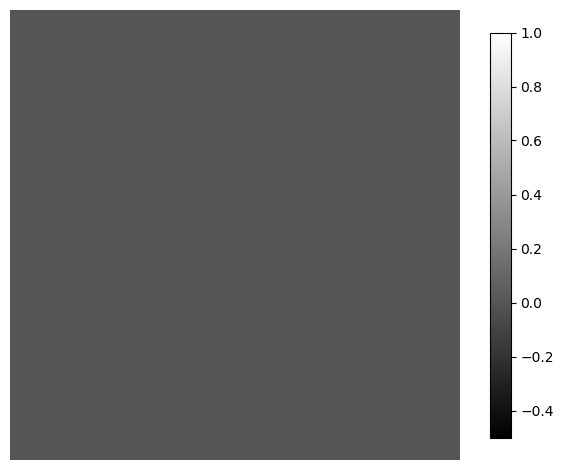

...

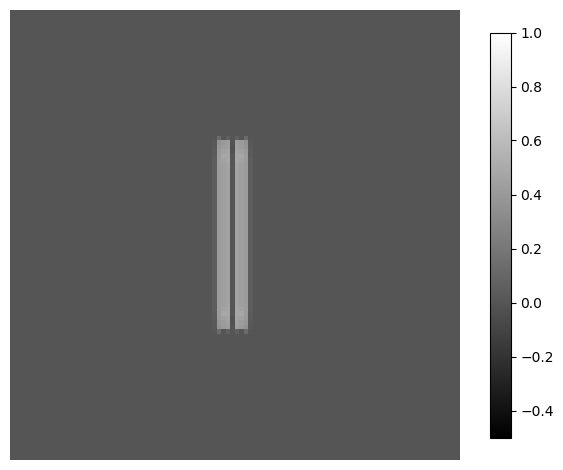

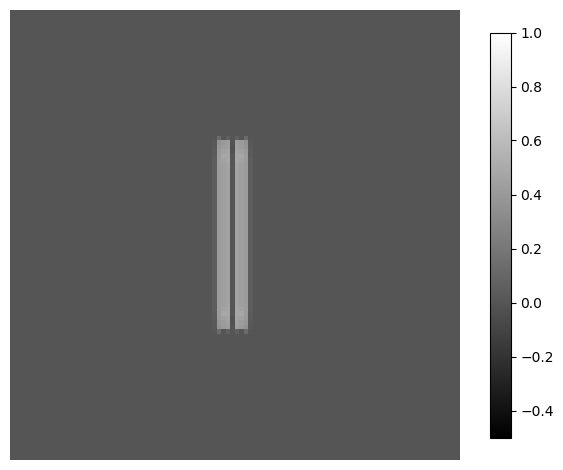

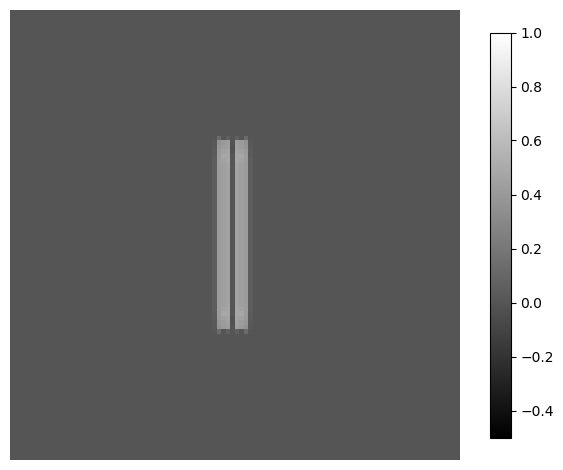

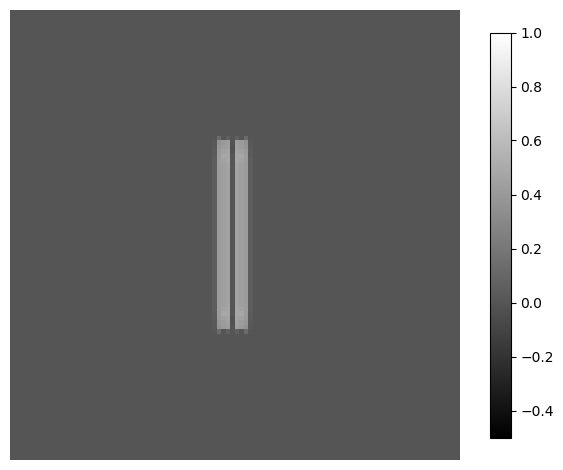

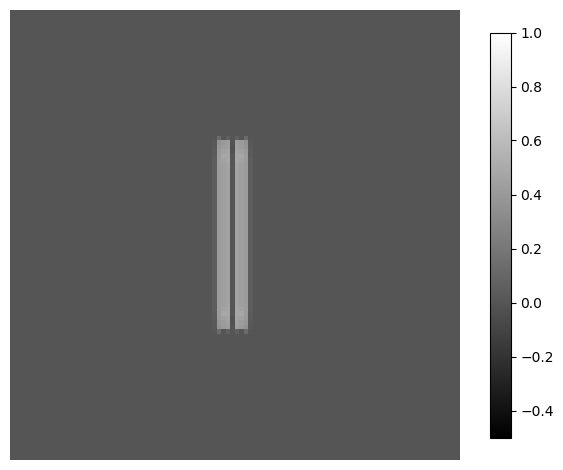

In [117]:
Utils.save_orientations_gs(sol[:,:,7,:], "z_k1", -0.5,1, true)

In [118]:
# img = convert(Array{Float32,2}, load("../input_img/Iine_100_100_gs.png"))[1:2,1:2];

In [119]:
function ff!(du, u, p, t)
   x = @view u[:, :, 1:p.K]
   y = @view u[:, :, p.K+1:2*p.K]
   m = @view u[:, :, 2*p.K+1:3*p.K]
   z = @view u[:, :, 3*p.K+1:4*p.K]
   s = @view u[:, :, 4*p.K+1:5*p.K]

#    C = @view uu[:, :, 5*p.K+1:6*p.K]
#    H_z = @view uu[:, :, 6*p.K+1:7*p.K]

   v_p = @view u[:, :, 5*p.K+1]
   v_m = @view u[:, :, 5*p.K+2]
#    x_lgn = @view uu[:, :, 7*p.K+3]

   dx = @view du[:, :, 1:p.K]
   dy = @view du[:, :, p.K+1:2*p.K]
   dm = @view du[:, :, 2*p.K+1:3*p.K]
   dz = @view du[:, :, 3*p.K+1:4*p.K]
   ds = @view du[:, :, 4*p.K+1:5*p.K]

   dv_p = @view du[:, :, 5*p.K+1]
   dv_m = @view du[:, :, 5*p.K+2]

#     x_lgn = zeros(p.dim_i, p.dim_j)
# C = reshape(zeros(p.dim_i, p.dim_j*p.K), p.dim_i, p.dim_j, p.K)
# H_z = copy(C);
    
   x_lgn = Laminart.fun_x_lgn(x, p)
   C = Laminart.fun_v_C(v_p, v_m, p)
   H_z = Laminart.fun_H_z(z, p)

#    dv_p = Laminart.fun_dv(v_p, p.r, x_lgn, p)
   dv_p = ones(p.dim_i, p.dim_j)
#    dv_m = Laminart.fun_dv(v_m, .-p.r, x_lgn, p)
#    dx = Laminart.fun_dx_V1(x, C, z, p.x_V2, p)
#    dy = Laminart.fun_dy(y, C, x, m, p)
#    dm = Laminart.fun_dm(m, x, p)
#    dz = Laminart.fun_dz(z, y, H_z, s, p)
#    ds = Laminart.fun_ds(s, z, H_z, p)
end

ff! (generic function with 1 method)

In [120]:
p = Laminart.kernels(img, Parameters.parameters);
p = Laminart.add_I_u_p(img, p);

In [72]:
# @parameters udt K δ_v δ_c δ_m δ_z δ_s σ_1 C_1 C_2 σ_2 γ α ϕ Γ V_21 μ ν n att η_p η_m λ a_23_ex a_23_in v12_6 v12_4 ψ C_AB_l H_σ_x H_σ_y H_fact H_l T_fact[1:length(p.T_fact)] T_p_m T_v2_fact H_size W_size lgn_equ_u lgn_equ_A lgn_equ_B k_gauss_1[1:size(p.k_gauss_1)[1],1:size(p.k_gauss_1)[2]] k_gauss_2[1:size(p.k_gauss_2)[1],1:size(p.k_gauss_2)[2]] k_C_d[1:size(p.k_C_d)[1],1:size(p.k_C_d)[2],1:size(p.k_C_d)[3]] k_C_b[1:size(p.k_C_b)[1],1:size(p.k_C_b)[2],1:size(p.k_C_b)[3]] k_W_p[1:size(p.k_W_p)[1],1:size(p.k_W_p)[2],1:size(p.k_W_p)[3],1:size(p.k_W_p)[4]] k_W_m[1:size(p.k_W_m)[1],1:size(p.k_W_m)[2],1:size(p.k_W_m)[3],1:size(p.k_W_m)[4]] k_H[1:size(p.k_H)[1],1:size(p.k_H)[2],1:size(p.k_H)[3]] k_T_p[1:size(p.k_T_p)[1],1:size(p.k_T_p)[2],1:size(p.k_T_p)[3]] k_T_m[1:size(p.k_T_m)[1],1:size(p.k_T_m)[2],1:size(p.k_T_m)[3]] k_T_p_v2[1:size(p.k_T_p_v2)[1],1:size(p.k_T_p_v2)[2],1:size(p.k_T_p_v2)[3]] k_T_m_v2[1:size(p.k_T_m_v2)[1],1:size(p.k_T_m_v2)[2],1:size(p.k_T_m_v2)[3]] x_V2[1:size(p.x_V2)[1],1:size(p.x_V2)[2],1:size(p.x_V2)[3]] I[1:size(p.I)[1],1:size(p.I)[2]] r[1:size(p.r)[1],1:size(p.r)[2]];

In [73]:
# @parameters t 
@variables du[1:p.dim_i, 1:p.dim_j, 1:5*p.K+2](t) u[1:p.dim_i, 1:p.dim_j, 1:5*p.K+2](t) ;

In [103]:
@parameters t 
@variables du[1:p.dim_i, 1:p.dim_j, 1:5*p.K+2](t) u[1:p.dim_i, 1:p.dim_j, 1:5*p.K+2](t) x_lgn[1:p.dim_i, 1:p.dim_j](t) C[1:p.dim_i, 1:p.dim_j, 1:p.K](t) H_z[1:p.dim_i, 1:p.dim_j, 1:p.K](t); 

In [75]:
pa = (K = p.K,
δ_v = δ_v,
δ_c = δ_c,
δ_m = δ_m,
δ_z = δ_z,
δ_s = δ_s,
σ_1 = σ_1 ,
C_1 = C_1,
C_2 = C_2,
σ_2 = σ_2 ,
γ = γ,
α = α,
ϕ = ϕ,
Γ = Γ,
V_21 = V_21, 
μ = μ,
ν = ν,
n = n,
att = att,
η_p = η_p,
η_m = η_m,
λ = λ,
a_23_ex = a_23_ex, 
a_23_in = a_23_in,
v12_6 = v12_6,
v12_4 = v12_4,
ψ = ψ, 
C_AB_l = C_AB_l, 
H_σ_x = H_σ_x,
H_σ_y = H_σ_y,
H_fact = H_fact, 
H_l = H_l,
T_fact = T_fact, 
T_p_m = T_p_m,
T_v2_fact = T_v2_fact, 
H_size = H_size,
W_size = W_size,
lgn_equ_u = lgn_equ_u,
lgn_equ_A = lgn_equ_A,
lgn_equ_B = lgn_equ_B,
k_gauss_1 = k_gauss_1,
k_gauss_2 = k_gauss_2,
k_C_d = k_C_d,
k_C_b = k_C_b,
k_W_p = k_W_p,
k_W_m = k_W_m,
k_H = k_H,
k_T_p = k_T_p, 
k_T_m = k_T_m,
k_T_p_v2 = k_T_p_v2, 
k_T_m_v2 = k_T_m_v2,
dim_i = p.dim_i,
dim_j = p.dim_j,
x_V2 = x_V2,
I = I,
r = r,
filling = p.filling);

In [76]:
par = [K => p.K,
    δ_v => p.δ_v,
δ_c => p.δ_c,
δ_m => p.δ_m,
δ_z => p.δ_z,
δ_s => p.δ_s,
σ_1 => p.σ_1 ,
C_1 => p.C_1,
C_2 => p.C_2,
σ_2 => p.σ_2 ,
γ => p.γ,
α => p.α,
ϕ => p.ϕ,
Γ => p.Γ,
V_21 => p.V_21,
μ => p.μ,
ν => p.ν,
n => p.n,
att => p.att,
η_p => p.η_p,
η_m => p.η_m,
λ => p.λ,
a_23_ex => p.a_23_ex,
a_23_in => p.a_23_in,
v12_6 => p.v12_6,
v12_4 => p.v12_4,
ψ => p.ψ,
C_AB_l => p.C_AB_l,
H_σ_x => p.H_σ_x,
H_σ_y => p.H_σ_y,
H_fact => p.H_fact,
H_l => p.H_l,
T_fact => p.T_fact,
T_p_m => p.T_p_m,
T_v2_fact => p.T_v2_fact,
H_size => p.H_size,
W_size => p.W_size,
lgn_equ_u => p.lgn_equ_u,
lgn_equ_A => p.lgn_equ_A,
lgn_equ_B => p.lgn_equ_B,
k_gauss_1 => p.k_gauss_1,
k_gauss_2 => p.k_gauss_2,
k_C_d => p.k_C_d,
k_C_b => p.k_C_b,
k_W_p => p.k_W_p,
k_W_m => p.k_W_m,
k_H => p.k_H,
k_T_p => p.k_T_p,
k_T_m => p.k_T_m,
k_T_p_v2 => p.k_T_p_v2,
k_T_m_v2 => p.k_T_m_v2,
x_V2 => p.x_V2,
I => p.I,
r => p.r];

In [104]:
ff!(du,u,p,0.0);

In [105]:
u0 = reshape(zeros(p.dim_i, p.dim_j*(5*p.K+2)), p.dim_i, p.dim_j, 5*p.K+2);

In [ ]:
jac = sparse(ModelingToolkit.jacobian(vec(du),vec(u),simplify=false))

In [ ]:
fjac = eval(ModelingToolkit.build_function(jac,u));

In [ ]:
prob_jac = ODEProblem(ODEFunction(ff!,jac = (du,u,p,t) -> fjac(du,u), jac_prototype = similar(jac,Float64)),u0,(0.0,10.0))

In [ ]:
prob = ODEProblem(ff!,u0,(0.0,1.0),p)

In [ ]:
sol = solve(prob)

In [98]:
sol.u

8-element Array{Array{Float64,3},1}:
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
 [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]

...

[0.0 0.0; 0.0 0.0]

[0

In [38]:
@parameters t δ_v δ_c δ_m δ_z δ_s σ_1 C_1 C_2 σ_2 γ α ϕ Γ V_21 μ ν n att η_p η_m λ a_23_ex a_23_in v12_6 v12_4 ψ C_AB_l H_σ_x H_σ_y H_fact H_l T_fact[1:length(p.T_fact)] T_p_m T_v2_fact H_size W_size lgn_equ_u lgn_equ_A lgn_equ_B k_gauss_1[1:size(p.k_gauss_1)[1],1:size(p.k_gauss_1)[2]] k_gauss_2[1:size(p.k_gauss_2)[1],1:size(p.k_gauss_2)[2]] k_C_d[1:size(p.k_C_d)[1],1:size(p.k_C_d)[2],1:size(p.k_C_d)[3]] k_C_b[1:size(p.k_C_b)[1],1:size(p.k_C_b)[2],1:size(p.k_C_b)[3]] k_W_p[1:size(p.k_W_p)[1],1:size(p.k_W_p)[2],1:size(p.k_W_p)[3],1:size(p.k_W_p)[4]] k_W_m[1:size(p.k_W_m)[1],1:size(p.k_W_m)[2],1:size(p.k_W_m)[3],1:size(p.k_W_m)[4]] k_H[1:size(p.k_H)[1],1:size(p.k_H)[2],1:size(p.k_H)[3]] k_T_p[1:size(p.k_T_p)[1],1:size(p.k_T_p)[2],1:size(p.k_T_p)[3]] k_T_m[1:size(p.k_T_m)[1],1:size(p.k_T_m)[2],1:size(p.k_T_m)[3]] k_T_p_v2[1:size(p.k_T_p_v2)[1],1:size(p.k_T_p_v2)[2],1:size(p.k_T_p_v2)[3]] k_T_m_v2[1:size(p.k_T_m_v2)[1],1:size(p.k_T_m_v2)[2],1:size(p.k_T_m_v2)[3]] x_V2[1:size(p.x_V2)[1],1:size(p.x_V2)[2],1:size(p.x_V2)[3]] I[1:size(p.I)[1],1:size(p.I)[2]] r[1:size(p.r)[1],1:size(p.r)[2]];

In [58]:
# @parameters t 
# @parameters t pa u x_V2
@variables v_p[1:p.dim_i, 1:p.dim_j](t) v_m[1:p.dim_i, 1:p.dim_j](t) x_lgn[1:p.dim_i, 1:p.dim_j](t) x[1:p.dim_i, 1:p.dim_j, 1:p.K](t) y[1:p.dim_i, 1:p.dim_j, 1:p.K](t) m[1:p.dim_i, 1:p.dim_j, 1:p.K](t) z[1:p.dim_i, 1:p.dim_j, 1:p.K](t) s[1:p.dim_i, 1:p.dim_j, 1:p.K](t) C[1:p.dim_i, 1:p.dim_j, 1:p.K](t) H_z[1:p.dim_i, 1:p.dim_j, 1:p.K](t) 
@derivatives D'~t

((D'~t),)

In [40]:
pa = (K = p.K,
δ_v = δ_v,
δ_c = δ_c,
δ_m = δ_m,
δ_z = δ_z,
δ_s = δ_s,
σ_1 = σ_1 ,
C_1 = C_1,
C_2 = C_2,
σ_2 = σ_2 ,
γ = γ,
α = α,
ϕ = ϕ,
Γ = Γ,
V_21 = V_21, 
μ = μ,
ν = ν,
n = n,
att = att,
η_p = η_p,
η_m = η_m,
λ = λ,
a_23_ex = a_23_ex, 
a_23_in = a_23_in,
v12_6 = v12_6,
v12_4 = v12_4,
ψ = ψ, 
C_AB_l = C_AB_l, 
H_σ_x = H_σ_x,
H_σ_y = H_σ_y,
H_fact = H_fact, 
H_l = H_l,
T_fact = T_fact, 
T_p_m = T_p_m,
T_v2_fact = T_v2_fact, 
H_size = H_size,
W_size = W_size,
lgn_equ_u = lgn_equ_u,
lgn_equ_A = lgn_equ_A,
lgn_equ_B = lgn_equ_B,
k_gauss_1 = k_gauss_1,
k_gauss_2 = k_gauss_2,
k_C_d = k_C_d,
k_C_b = k_C_b,
k_W_p = k_W_p,
k_W_m = k_W_m,
k_H = k_H,
k_T_p = k_T_p, 
k_T_m = k_T_m,
k_T_p_v2 = k_T_p_v2, 
k_T_m_v2 = k_T_m_v2,
dim_i = p.dim_i,
dim_j = p.dim_j,
x_V2 = x_V2,
I = I,
r = r,
filling = p.filling);

In [42]:

temp_v_p = Laminart.fun_dv(v_p, pa.r, x_lgn, pa)
temp_v_m = Laminart.fun_dv(v_m, .-pa.r, x_lgn, pa)
temp_x_lgn = Laminart.fun_x_lgn(x,pa)
temp_Dx = Laminart.fun_dx_V1(x, C, z, pa.x_V2, pa)
temp_Dy = Laminart.fun_dy(y, C, x, m, pa)
temp_Dm = Laminart.fun_dm(m, x, pa)
temp_Dz = Laminart.fun_dz(z, y, H_z, s, pa)
temp_Ds = Laminart.fun_ds(s, z, H_z, pa)
temp_H_z = Laminart.fun_H_z(z, pa)
temp_C = Laminart.fun_v_C(v_p, v_m, pa)

equ = [D(v_p[1,1]) ~ temp_v_p[1,1],
D(v_p[1,2]) ~ temp_v_p[1,2],
D(v_p[2,1]) ~ temp_v_p[2,1],
D(v_p[2,2]) ~ temp_v_p[2,2],]

for i ∈ 1:p.dim_i
    for j ∈ 1:p.dim_j
        append!(equ, [
#         D(v_p[i,j]) ~ temp_v_p[i,j], 
        D(v_m[i,j]) ~ temp_v_m[i,j],
        x_lgn[i,j] ~ temp_x_lgn[i,j]])

        for k ∈ 1:p.K
            append!(equ, [
            D(x[i,j,k]) ~ temp_Dx[i,j,k],
            D(y[i,j,k]) ~ temp_Dy[i,j,k],
            D(m[i,j,k]) ~ temp_Dm[i,j,k],
            D(z[i,j,k]) ~ temp_Dz[i,j,k],
            D(s[i,j,k]) ~ temp_Ds[i,j,k],
            H_z[i,j,k] ~ temp_H_z[i,j,k],
            C[i,j,k] ~ temp_C[i,j,k]])
        end
    end
end

In [59]:
equ = [D(v_p[1:p.dim_i, 1:p.dim_j]) ~ Laminart.fun_dv(v_p, pa.r, x_lgn, pa)]

MethodError: MethodError: Cannot `convert` an object of type Array{Operation,2} to an object of type Expression
Closest candidates are:
  convert(::Type{Expression}, !Matched::Operation) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/utils.jl:15
  convert(::Type{Expression}, !Matched::Expression) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/utils.jl:11
  convert(::Type{Expression}, !Matched::Bool) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/utils.jl:13
  ...

In [60]:
Laminart.fun_dv(v_p, pa.r, x_lgn, pa)

2×2 Array{Operation,2}:
 δ_v * ((-(v_p₁ˏ₁(t)) + ((1 - v_p₁ˏ₁(t)) * max(r₁ˏ₁, 0)) * (1 + C_1 * x_lgn₁ˏ₁(t))) - ((1 + v_p₁ˏ₁(t)) * C_2) * (((((((((((((((((((((((((0 + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₁) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₂) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₃) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₄) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₅))  …  δ_v * ((-(v_p₁ˏ₂(t)) + ((1 - v_p₁ˏ₂(t)) * max(r₁ˏ₂, 0)) * (1 + C_1 * x_lgn₁ˏ₂(t)))

In [29]:
equ = []
temp_v_p = Laminart.fun_dv(v_p, pa.r, x_lgn, pa)
temp_v_m = Laminart.fun_dv(v_m, .-pa.r, x_lgn, pa)
temp_x_lgn = Laminart.fun_x_lgn(x,pa)
temp_Dx = Laminart.fun_dx_V1(x, C, z, pa.x_V2, pa)
temp_Dy = Laminart.fun_dy(y, C, x, m, pa)
temp_Dm = Laminart.fun_dm(m, x, pa)
temp_Dz = Laminart.fun_dz(z, y, H_z, s, pa)
temp_Ds = Laminart.fun_ds(s, z, H_z, pa)
temp_H_z = Laminart.fun_H_z(z, pa)
temp_C = Laminart.fun_v_C(v_p, v_m, pa)

for i ∈ 1:p.dim_i
    for j ∈ 1:p.dim_j
        append!(equ, [
        D(v_p[i,j]) ~ temp_v_p[i,j]]) 
#         D(v_m[i,j]) ~ temp_v_m[i,j],
#         x_lgn[i,j] ~ temp_x_lgn[i,j]])

#         for k ∈ 1:p.K
#             append!(equ, [
#             D(x[i,j,k]) ~ temp_Dx[i,j,k],
#             D(y[i,j,k]) ~ temp_Dy[i,j,k],
#             D(m[i,j,k]) ~ temp_Dm[i,j,k],
#             D(z[i,j,k]) ~ temp_Dz[i,j,k],
#             D(s[i,j,k]) ~ temp_Ds[i,j,k],
#             H_z[i,j,k] ~ temp_H_z[i,j,k],
#             C[i,j,k] ~ temp_C[i,j,k]])
#         end
    end
end

In [69]:

# temp_v_p = Laminart.fun_dv(v_p, pa.r, x_lgn, pa)
# temp_v_m = Laminart.fun_dv(v_m, .-pa.r, x_lgn, pa)
# temp_x_lgn = Laminart.fun_x_lgn(x,pa)
# temp_Dx = Laminart.fun_dx_V1(x, C, z, pa.x_V2, pa)
# temp_Dy = Laminart.fun_dy(y, C, x, m, pa)
# temp_Dm = Laminart.fun_dm(m, x, pa)
# temp_Dz = Laminart.fun_dz(z, y, H_z, s, pa)
# temp_Ds = Laminart.fun_ds(s, z, H_z, pa)
# temp_H_z = Laminart.fun_H_z(z, pa)
# temp_C = Laminart.fun_v_C(v_p, v_m, pa)

# equ = [D(v_p) ~ temp_v_p]
# #         D(v_m) ~ temp_v_m,
# #         x_lgn ~ temp_x_lgn,
# #             D(x) ~ temp_Dx,
# #             D(y) ~ temp_Dy,
# #             D(m) ~ temp_Dm,
# #             D(z) ~ temp_Dz,
# #             D(s) ~ temp_Ds,
# #             H_z ~ temp_H_z,
# #             C ~ temp_C]

MethodError: MethodError: Cannot `convert` an object of type Array{Operation,2} to an object of type Expression
Closest candidates are:
  convert(::Type{Expression}, !Matched::Operation) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/utils.jl:15
  convert(::Type{Expression}, !Matched::Expression) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/utils.jl:11
  convert(::Type{Expression}, !Matched::Bool) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/utils.jl:13
  ...

In [43]:
sys = ODESystem(equ);

In [32]:
sys.tgrad

Base.RefValue{Array{Expression,1}}(Expression[])

In [35]:
u0

10-element Array{Pair{Array{Operation,N} where N,Array{Float32,N} where N},1}:
                                                             [v_p₁ˏ₁(t) v_p₁ˏ₂(t); v_p₂ˏ₁(t) v_p₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]
                                                             [v_m₁ˏ₁(t) v_m₁ˏ₂(t); v_m₂ˏ₁(t) v_m₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]
                 [x₁ˏ₁ˏ₁(t) x₁ˏ₂ˏ₁(t); x₂ˏ₁ˏ₁(t) x₂ˏ₂ˏ₁(t)]

[x₁ˏ₁ˏ₂(t) x₁ˏ₂ˏ₂(t); x₂ˏ₁ˏ₂(t) x₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [y₁ˏ₁ˏ₁(t) y₁ˏ₂ˏ₁(t); y₂ˏ₁ˏ₁(t) y₂ˏ₂ˏ₁(t)]

[y₁ˏ₁ˏ₂(t) y₁ˏ₂ˏ₂(t); y₂ˏ₁ˏ₂(t) y₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [m₁ˏ₁ˏ₁(t) m₁ˏ₂ˏ₁(t); m₂ˏ₁ˏ₁(t) m₂ˏ₂ˏ₁(t)]

[m₁ˏ₁ˏ₂(t) m₁ˏ₂ˏ₂(t); m₂ˏ₁ˏ₂(t) m₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [z₁ˏ₁ˏ₁(t) z₁ˏ₂ˏ₁(t); z₂ˏ₁ˏ₁(t) z₂ˏ₂ˏ₁(t)]

[z₁ˏ₁ˏ₂(t) z₁ˏ₂ˏ₂(t); z₂ˏ₁ˏ₂(t) z₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [s₁ˏ₁ˏ₁(t) s₁ˏ₂ˏ₁(t); s₂ˏ₁ˏ₁(t) s₂ˏ₂ˏ₁(t)]

[s₁ˏ₁ˏ₂(t) s₁ˏ₂ˏ₂(t); s₂

In [24]:
equ[1]

Equation(derivative(v_p₁ˏ₁(t), t), δ_v * ((-(v_p₁ˏ₁(t)) + ((1 - v_p₁ˏ₁(t)) * max(r₁ˏ₁, 0)) * (1 + C_1 * x_lgn₁ˏ₁(t))) - ((1 + v_p₁ˏ₁(t)) * C_2) * (((((((((((((((((((((((((0 + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₁) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₂) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₃) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₄) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₅)))

In [44]:
u0 = [  v_p => zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j),
        v_m => zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j),
        x => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K),
        y => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K),
        m => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K),
        z => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K),
        s => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K),
        H_z => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K),
        x_lgn => zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j),
        C => reshape(zeros(typeof(p.I[1,1]), p.dim_i, p.dim_j * p.K), p.dim_i, p.dim_i, p.K)];

In [45]:
par = [δ_v => p.δ_v,
δ_c => p.δ_c,
δ_m => p.δ_m,
δ_z => p.δ_z,
δ_s => p.δ_s,
σ_1 => p.σ_1 ,
C_1 => p.C_1,
C_2 => p.C_2,
σ_2 => p.σ_2 ,
γ => p.γ,
α => p.α,
ϕ => p.ϕ,
Γ => p.Γ,
V_21 => p.V_21,
μ => p.μ,
ν => p.ν,
n => p.n,
att => p.att,
η_p => p.η_p,
η_m => p.η_m,
λ => p.λ,
a_23_ex => p.a_23_ex,
a_23_in => p.a_23_in,
v12_6 => p.v12_6,
v12_4 => p.v12_4,
ψ => p.ψ,
C_AB_l => p.C_AB_l,
H_σ_x => p.H_σ_x,
H_σ_y => p.H_σ_y,
H_fact => p.H_fact,
H_l => p.H_l,
T_fact => p.T_fact,
T_p_m => p.T_p_m,
T_v2_fact => p.T_v2_fact,
H_size => p.H_size,
W_size => p.W_size,
lgn_equ_u => p.lgn_equ_u,
lgn_equ_A => p.lgn_equ_A,
lgn_equ_B => p.lgn_equ_B,
k_gauss_1 => p.k_gauss_1,
k_gauss_2 => p.k_gauss_2,
k_C_d => p.k_C_d,
k_C_b => p.k_C_b,
k_W_p => p.k_W_p,
k_W_m => p.k_W_m,
k_H => p.k_H,
k_T_p => p.k_T_p,
k_T_m => p.k_T_m,
k_T_p_v2 => p.k_T_p_v2,
k_T_m_v2 => p.k_T_m_v2,
x_V2 => p.x_V2,
I => p.I,
r => p.r];

In [85]:
sys

ODESystem(Equation[Equation(derivative(v_p₁ˏ₁(t), t), δ_v * ((-(v_p₁ˏ₁(t)) + ((1 - v_p₁ˏ₁(t)) * max(r₁ˏ₁, 0)) * (1 + C_1 * x_lgn₁ˏ₁(t))) - ((1 + v_p₁ˏ₁(t)) * C_2) * (((((((((((((((((((((((((0 + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₁) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₂) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₃) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₄) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₅))), Equation(derivative(v_p₁ˏ₂(t), t), δ_v * ((-(v_p₁ˏ₂(t))

In [46]:
tspan = (0.0,1.0)
prob = ODEProblem(sys,u0,tspan,par)

MethodError: MethodError: Cannot `convert` an object of type 
  Array{Operation,2} to an object of type 
  Variable
Closest candidates are:
  convert(::Type{Variable}, !Matched::Operation) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/ModelingToolkit.jl:76
  convert(::Type{T}, !Matched::T) where T at essentials.jl:171
  Variable(::Any) at /Users/niallcullinane/.julia/packages/ModelingToolkit/boV4s/src/variables.jl:50
  ...

In [ ]:
sol = solve(prob)

In [49]:
odef = ODEFunction(sys)

ErrorException: Only semi-explicit constant mass matrices are currently supported

In [47]:
sys.ps

188-element Array{Variable,1}:
 k_C_d₂ˏ₃ˏ₂
 C_2
 k_C_b₂ˏ₄ˏ₂
 k_C_b₅ˏ₅ˏ₁
 k_gauss_2₄ˏ₁
 k_gauss_2₅ˏ₃
 k_C_b₂ˏ₁ˏ₂
 k_C_b₃ˏ₁ˏ₂
 k_C_d₁ˏ₂ˏ₁
 k_T_m₁ˏ₁ˏ₁
 k_C_d₃ˏ₂ˏ₁
 r₁ˏ₂
 k_C_d₁ˏ₄ˏ₂
 ⋮
 η_m
 k_C_d₃ˏ₃ˏ₁
 k_C_d₄ˏ₃ˏ₂
 k_C_b₃ˏ₃ˏ₁
 k_C_d₁ˏ₁ˏ₂
 k_C_d₁ˏ₂ˏ₂
 ψ
 V_21
 k_gauss_2₄ˏ₂
 k_gauss_2₃ˏ₅
 k_C_d₃ˏ₄ˏ₁
 γ

In [48]:
u0

10-element Array{Pair{Array{Operation,N} where N,Array{Float32,N} where N},1}:
                                                             [v_p₁ˏ₁(t) v_p₁ˏ₂(t); v_p₂ˏ₁(t) v_p₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]
                                                             [v_m₁ˏ₁(t) v_m₁ˏ₂(t); v_m₂ˏ₁(t) v_m₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]
                 [x₁ˏ₁ˏ₁(t) x₁ˏ₂ˏ₁(t); x₂ˏ₁ˏ₁(t) x₂ˏ₂ˏ₁(t)]

[x₁ˏ₁ˏ₂(t) x₁ˏ₂ˏ₂(t); x₂ˏ₁ˏ₂(t) x₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [y₁ˏ₁ˏ₁(t) y₁ˏ₂ˏ₁(t); y₂ˏ₁ˏ₁(t) y₂ˏ₂ˏ₁(t)]

[y₁ˏ₁ˏ₂(t) y₁ˏ₂ˏ₂(t); y₂ˏ₁ˏ₂(t) y₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [m₁ˏ₁ˏ₁(t) m₁ˏ₂ˏ₁(t); m₂ˏ₁ˏ₁(t) m₂ˏ₂ˏ₁(t)]

[m₁ˏ₁ˏ₂(t) m₁ˏ₂ˏ₂(t); m₂ˏ₁ˏ₂(t) m₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [z₁ˏ₁ˏ₁(t) z₁ˏ₂ˏ₁(t); z₂ˏ₁ˏ₁(t) z₂ˏ₂ˏ₁(t)]

[z₁ˏ₁ˏ₂(t) z₁ˏ₂ˏ₂(t); z₂ˏ₁ˏ₂(t) z₂ˏ₂ˏ₂(t)] => [0.0 0.0; 0.0 0.0]

[0.0 0.0; 0.0 0.0]
                 [s₁ˏ₁ˏ₁(t) s₁ˏ₂ˏ₁(t); s₂ˏ₁ˏ₁(t) s₂ˏ₂ˏ₁(t)]

[s₁ˏ₁ˏ₂(t) s₁ˏ₂ˏ₂(t); s₂

In [88]:
sys

ODESystem(Equation[Equation(derivative(v_p₁ˏ₁(t), t), δ_v * ((-(v_p₁ˏ₁(t)) + ((1 - v_p₁ˏ₁(t)) * max(r₁ˏ₁, 0)) * (1 + C_1 * x_lgn₁ˏ₁(t))) - ((1 + v_p₁ˏ₁(t)) * C_2) * (((((((((((((((((((((((((0 + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₁) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₁) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₁) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₂) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₂) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₂) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₃) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₃) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₃) + x_lgn₁ˏ₂(t) * k_gauss_1₁ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₂ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₃ˏ₄) + x_lgn₂ˏ₂(t) * k_gauss_1₄ˏ₄) + x_lgn₁ˏ₂(t) * k_gauss_1₅ˏ₄) + x_lgn₁ˏ₁(t) * k_gauss_1₁ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₂ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₃ˏ₅) + x_lgn₂ˏ₁(t) * k_gauss_1₄ˏ₅) + x_lgn₁ˏ₁(t) * k_gauss_1₅ˏ₅))), Equation(derivative(v_p₁ˏ₂(t), t), δ_v * ((-(v_p₁ˏ₂(t))